# Introduction

Check the readme files in the folder to learn how to run scans and use defaults vs specify parameters

# Initialize

In [1]:
cfg_file='sample_68.yml' # Configuration file name
expt_path = 'C:\\_Data\\sample_68\\' # Experiment data path

max_t1 = 250 # Maximum T1 to consider when doing experiments (in us)

## Imports

In [2]:
import numpy as np
import matplotlib.pyplot as plt
from tqdm.notebook import tqdm

np.set_printoptions(legacy="1.25")
from qick import QickConfig

from slab_qick_calib.exp_handling.instrumentmanager import InstrumentManager
import slab_qick_calib.experiments as meas
from slab_qick_calib.calib import qubit_tuning, measure_func
from slab_qick_calib.calib.time_tracking import time_tracking
from slab_qick_calib.analysis import qubit_params 
from slab_qick_calib.helpers import qick_check, config, handy

%load_ext autoreload
%autoreload 2

# Set color palette and font size
handy.config_figs()

<module 'slab_qick_calib.experiments' from 'C:\\_Lib\\python\\qq\\slab_qick_calib\\experiments\\__init__.py'>
C:\_Lib\python\qq\slab_qick_calib\experiments
imported slab_qick_calib.experiments.general.qick_experiment
imported slab_qick_calib.experiments.general.qick_experiment_2q
imported slab_qick_calib.experiments.general.qick_program
C:\_Lib\python\qq\slab_qick_calib\experiments\general
C:\_Lib\python\qq\slab_qick_calib\experiments\single_qubit
imported slab_qick_calib.experiments.single_qubit.active_reset
imported slab_qick_calib.experiments.single_qubit.pulse_probe_spectroscopy
imported slab_qick_calib.experiments.single_qubit.rabi
imported slab_qick_calib.experiments.single_qubit.resonator_spectroscopy
imported slab_qick_calib.experiments.single_qubit.single_shot
imported slab_qick_calib.experiments.single_qubit.single_shot_opt
imported slab_qick_calib.experiments.single_qubit.stark_spectroscopy
imported slab_qick_calib.experiments.single_qubit.t1
imported slab_qick_calib.experim

In [3]:
import qick

In [4]:
qick.__version__

'0.2.360'

## Set up new config 
Set to variables to True when setting up a new experiment config file. 

Note: make sure you set your ADC/DAC channels correctly. This code does not automatically fill in the ADC/DAC into your configuration file, so you should check yourself to make sure these values are correct. 

There are several elements that you may want to customize based on your readout parameters and coherence times. Check readme file config_manual.md

In [5]:
# Set to false if you aren't creating a new one
new_config = False
new_folder = False

nqubits = 3
rfsoc_alias = 'bf1_soc'
t1_guess = 50 
ip = '10.108.30.23' # ip address of name server that rfsoc is connected to 
import os

configs_dir = os.path.join(os.getcwd(),'../', 'configs')

cfg_file_path = os.path.join(configs_dir, cfg_file)
images_dir = os.path.join(expt_path, 'images')
summary_dir = os.path.join(images_dir, 'summary')

if new_config or new_folder:
    if new_config:
        config.init_config(cfg_file_path, nqubits, type='full', aliases=rfsoc_alias, t1=t1_guess, ip=ip)
        config.init_model_config(cfg_file_path, nqubits)


    if not os.path.exists(expt_path):
        os.makedirs(expt_path)
        os.mkdir(images_dir)
        os.mkdir(summary_dir)

print('Data will be stored in', expt_path)

Data will be stored in C:\_Data\sample_68\


## Connect to RFSoC
Before running first cell, make sure a nameserver is running on the network, the Qick board is connected to it, and the ip address listed below matches that of the nameserver. 

You just need to run the first cell, then should be able to run any other cell in whatever order. 

If you need to restart the RFSoC, you should reconnect it to the nameserver and rerun this. 

In [6]:
# Results config file
cfg_path = os.path.join(os.getcwd(),'..', 'configs', cfg_file)
auto_cfg = config.load(cfg_path)

# Connect to instruments
im = InstrumentManager(ns_address=auto_cfg['aliases']['ip'])
print(im)

soc = im[auto_cfg['aliases']['soc']]
soccfg = QickConfig(soc.get_cfg())

cfg_dict = {'soc': soccfg, 'expt_path': expt_path, 'cfg_file': cfg_path, 'im': im}

{'Pyro.NameServer': <Pyro4.core.Proxy at 0x1fe0e088080; not connected; for PYRO:Pyro.NameServer@10.108.30.23:9090>, 'bf1_soc': <Pyro4.core.Proxy at 0x1fe0e849580; not connected; for PYRO:obj_3516acd72517435ea4973b4b084dcce3@10.108.30.74:40829>}


In [7]:
print(soccfg)
# ADC 10
# DAC 0 / 1/ 2 /3  

QICK running on ZCU216, software version 0.2.360

Firmware configuration (built Sun Jun 15 22:25:25 2025):

	Global clocks (MHz): tProc dispatcher timing 430.080, RF reference 245.760
	Groups of related clocks: [tProc core clock, tProc timing clock, DAC tile 1, DAC tile 2, DAC tile 3], [DAC tile 0], [ADC tile 1, ADC tile 2]

	16 signal generator channels:
	0:	axis_signal_gen_v6 - fs=9584.640 Msps, fabric=599.040 MHz
		envelope memory: 65536 complex samples (6.838 us)
		32-bit DDS, range=9584.640 MHz
		DAC tile 0, blk 0 is 0_228 on JHC1, or QICK box DAC port 0
	1:	axis_signal_gen_v6 - fs=9584.640 Msps, fabric=599.040 MHz
		envelope memory: 16384 complex samples (1.709 us)
		32-bit DDS, range=9584.640 MHz
		DAC tile 0, blk 1 is 1_228 on JHC2, or QICK box DAC port 1
	2:	axis_signal_gen_v6 - fs=9584.640 Msps, fabric=599.040 MHz
		envelope memory: 32768 complex samples (3.419 us)
		32-bit DDS, range=9584.640 MHz
		DAC tile 0, blk 2 is 2_228 on JHC1, or QICK box DAC port 2
	3:	axis_signal_ge

## Check QICK issues

### Check mirror frequencies on qubit

In [8]:
qick_check.check_freqs(0, cfg_dict)

Nyquist frequency: 4792.32 MHz
Possible g-e frequencies: 4000 MHz and 5584.639999999999 MHz
Possible e-f frequencies: 3800 MHz and 5784.639999999999 MHz
Anharmonicity: 200 MHz. With aliased e-f: -1784.6399999999994 MHz
Aliased e-f frequency is greater than both g-e frequencies.
Recommendation: Current e-f frequency is the correct choice.


### Check mirror frequencies from resonators

In [9]:
qick_check.check_resonances(cfg_dict)

Nyquist frequency: 4792.32 MHz
Configured resonator frequencies (MHz):
3940.981 7127.372 7687.502 7000
Aliased resonator frequencies (MHz):
5643.659 2457.268 1897.138 2584.64
Qubit frequencies (MHz):
4000 4000 4000 4000
Difference between mirror resonator and qubit frequencies (MHz):
-1643.659 1542.732 2102.862 1415.36


### Check sampling rates and minimum point spacing

In [10]:

fnyq = cfg_dict['soc']._get_ch_cfg(ro_ch=0)['f_dds']/2
clock_tick = 1e3*cfg_dict['soc'].cycles2us(1)
print(f'ADC Nyquist frequency is {fnyq} MHz')
print(f'1 clock tick is {clock_tick} ns')

ADC Nyquist frequency is 1228.8 MHz
1 clock tick is 2.3251488095238093 ns


### Make sure you're not near the nyquist frequency of the ADC

In [11]:
qick_check.check_adc(cfg_dict)

ADC sampling frequency: 2457.6


# Set on board attenuation and filter

In [295]:
# Set attenuator on DAC.
soc.rfb_set_gen_rf(0, 0, 0)
soc.rfb_set_gen_rf(1, 0, 0)
# Set attenuator on ADC.
soc.rfb_set_ro_rf(0, 30)

30.0

In [296]:
# Clear filters
soc.rfb_set_gen_filter(0, fc=0, ftype='bypass')
soc.rfb_set_gen_filter(1, fc=0, ftype='bypass')
soc.rfb_set_ro_filter(0, fc=0, ftype='bypass')

In [ ]:
auto_cfg.hw.soc.adcs.readout.ch[0]

10

In [16]:
def setup_readout_chain(qubit, bw_adc=1000, bw_dac=100, atten1_dac=0, atten2_dac=0, atten_adc=30, cfg=auto_cfg, hw=soc):
    """
    Configure readout path for a given qubit:
      - Set RO/GEN bandpass filters around the qubit's readout frequency.
      - Set DAC/ADC attenuations.
    Returns a dict with channel indices and readout frequency.
    """
    adc_ch = cfg.hw.soc.adcs.readout.ch[qubit]
    dac_ch = cfg.hw.soc.dacs.readout.ch[qubit]
    readout_freq = cfg.device.readout.frequency[qubit]

    # Set band pass filters
    hw.rfb_set_ro_filter(adc_ch, fc=readout_freq / 1000, ftype="bandpass", bw=bw_adc / 1000)
    hw.rfb_set_gen_filter(dac_ch, fc=readout_freq / 1000, ftype="bandpass", bw=bw_dac / 1000)

    # Set attenuators
    hw.rfb_set_gen_rf(dac_ch, atten1_dac, atten2_dac)
    hw.rfb_set_ro_rf(adc_ch, atten_adc)

    return {"ADC_ch": adc_ch, "DAC_ch": dac_ch, "readout_freq": readout_freq}

In [17]:
def setup_qubit_drive_chain(qubit, bw=1000, atten1_dac=0, atten2_dac=0, center_freq=None, cfg=auto_cfg, hw=soc):
    """
    Configure qubit drive path for a given qubit:
      - Set GEN bandpass filter(s) around the qubit drive frequency and/or provided 'ant' values.
      - Set DAC attenuations.
    Returns:
      dict: {"DAC_ch": dac_ch, "drive_freq": drive_freq, "filters_set": [{"fc": fc, "bw": bw}]}
    """
    dac_ch = cfg.hw.soc.dacs.qubit.ch[qubit]
    drive_freq = cfg.device.qubit.f_ge[qubit]

    # Normalize ant_values to a list of MHz centers
    if center_freq is None:
        centers = [drive_freq]
    else:
        centers = center_freq

    # Set band pass filter
    hw.rfb_set_gen_filter(dac_ch, fc=drive_freq / 1000, ftype="bandpass", bw=bw / 1000)

    # Set attenuators
    hw.rfb_set_gen_rf(dac_ch, atten1_dac, atten2_dac)

    return {"DAC_ch": dac_ch, "drive_freq": drive_freq}

# Time of Flight (TOF)

TOF measures the time it takes for the signal to run through the wires. It will give us the time in clock ticks that we should wait to make a measurements 

 Use this to set trig_offset in config file

  0%|          | 0/1000 [00:00<?, ?it/s]

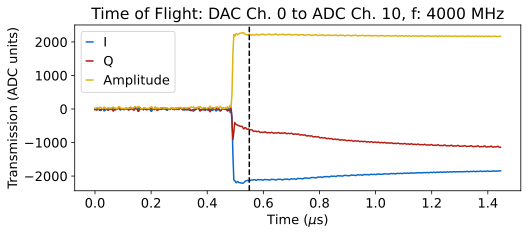

In [18]:
qubit_list = np.arange(3)
qubit_list = [0]
for qi in qubit_list:  
        # tof=meas.ToFCalibrationExperiment(cfg_dict=cfg_dict, qi=qi)

        # Set frequency of choice and readout length (up to 13 us for standard ZCU216 firmware, readout)
        tof=meas.ToFCalibrationExperiment(cfg_dict=cfg_dict, qi=qi, params={'frequency':4000})

## Set trig_offset to point where signal has appeared, usually around 300-500 ns

In [19]:
qubit_list=np.arange(3)
for qi in qubit_list: 
    auto_cfg = config.update_readout(cfg_path, 'trig_offset', 0.52, qi)

*Set cfg device.readout 0 trig_offset to 0.52 from 0.55*
*Set cfg device.readout 1 trig_offset to 0.52 from 0.55*
*Set cfg device.readout 2 trig_offset to 0.52 from 0.55*


## Collect many time traces of TOF data (for examining measurement data)

check_e first prepares e state

In [ ]:
tof2d = meas.ToF2D(cfg_dict=cfg_dict, qi=qi, params={'expts_count':10000, 'readout_length': 13})
tof2d = meas.ToF2D(cfg_dict=cfg_dict, qi=qi, params={'expts_count':10000, 'readout_length': 13,'check_e':True})

# Power calibration

In [135]:
# the main program class
from qick.asm_v2 import AveragerProgramV2

In [144]:
class SimpleSweepProgram2(AveragerProgramV2):
    def _initialize(self, cfg):
        ro_ch = cfg['ro_ch']
        gen_ch = cfg['gen_ch']
        
        self.declare_gen(ch=gen_ch, nqz=cfg['nqz'])
        self.declare_readout(ch=ro_ch, length=cfg['ro_len'])

        self.add_loop("myloop", self.cfg["steps"])
        self.add_readoutconfig(ch=ro_ch, name="myro", freq=cfg['freq'], gen_ch=gen_ch)

        #self.add_gauss(ch=gen_ch, name="ramp", sigma=cfg['ramp_len']/10, length=cfg['ramp_len'], even_length=True)
        self.add_pulse(ch=gen_ch, name="mypulse", ro_ch=ro_ch, 
                       style="const", 
                       #envelope="ramp", 
                       freq=cfg['freq'], 
                       length=cfg['len'],
                       phase=cfg['phase'],
                       gain=cfg['gain'], 
                        mode = "periodic"
                      )

        
        self.send_readoutconfig(ch=cfg['ro_ch'], name="myro", t=0)
        
    def _body(self, cfg):
        self.pulse(ch=cfg['gen_ch'], name="mypulse", t=0)
        self.trigger(ros=[cfg['ro_ch']], t=cfg['trig_time'])


In [151]:
qi = 0

setup_readout_chain(qi, bw=100, atten1_dac=0, atten2_dac=0, atten_adc=30, cfg=auto_cfg, hw=soc)

config_pow_cali = {'steps': 5,
          'gen_ch': 0,
          'ro_ch': 0,
          'freq': auto_cfg.device.readout.frequency[qi],
          #'mixer_freq': 1400,
          'nqz': 2,
          'trig_time': 0.45,
          'ro_len': 0.3,
          'len': 0.05,
          'ramp_len': 0.2,
          'phase': 0.0,
          'gain': 0 # 0.002
         }

prog = SimpleSweepProgram2(soccfg, reps=1, final_delay=0.5, cfg=config_pow_cali)

iq_list = prog.acquire(soc, rounds=1)

  0%|          | 0/5 [00:00<?, ?it/s]

# Resonator Spectroscopy 

Run resonator spectroscopy for all resonators by choosing a large frequency scan to look over. The scan will then find the different resonators and fill in the config file with their respective frequencies. In the autocalibration, there will be a finer sweep of each resonator to more accurately find its frequency. The frequencies are saved in <code>auto_cfg.device.readout.frequency</code>

## Coarse 

This will perform peak finding
Use params to specify frequency range, averaging, gain, expts. 
If gain is too high, you may be in punch out region, where resonators disappear, or above it 

### Res 

  0%|          | 0/300000 [00:00<?, ?it/s]

Number of peaks: 0


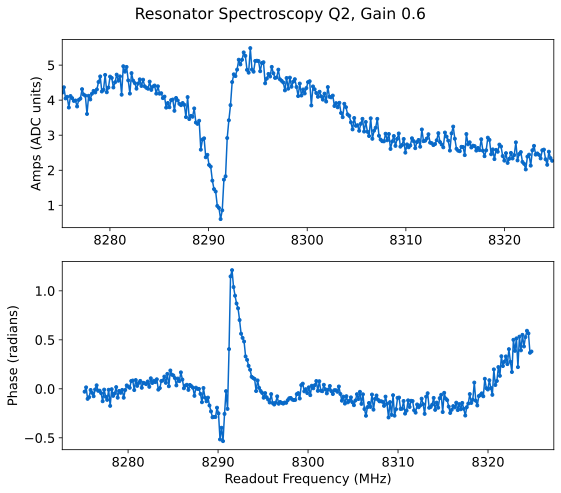

In [306]:
qi=2 # We only run this once for all qubits on a single feedline, this is a dummy value to make the scan work 
params={'start':8275, 'span':50, 'reps':1000, 'gain':0.6, 'expts':300}
rspecc = meas.ResSpec(cfg_dict, qi=qi, style='coarse', progress=True, params=params)
res_values = rspecc.data['coarse_peaks']

In [98]:
res_values = np.delete(res_values, 2)

## Fine

This will fit the resonance amplitude

Can run scan with default options, or specify your own, by commenting out different lines and editing paramters. 

### First time after running coarse scan, using res_values list
Assumes you have the same number of res_values as qubits. 
First time you run scan, plot will appear weird first because it plots the resonator frequency in the config on the same plot. Just run again

In [ ]:
update=False

num_peaks = len(res_values)

for qi in  range(1,len(res_values)):    
    # Used for initial finding of resonance 
    rspec = meas.ResSpec(cfg_dict, qi=qi, params={'span':10, 'gain': 0.5, 'center':res_values[qi]}, disp_kwargs={'plot_res':False})

    if update: rspec.update()

### Fine resonator scan

Once the correct frequencies are saved to your config file. 

  0%|          | 0/1001000 [00:00<?, ?it/s]

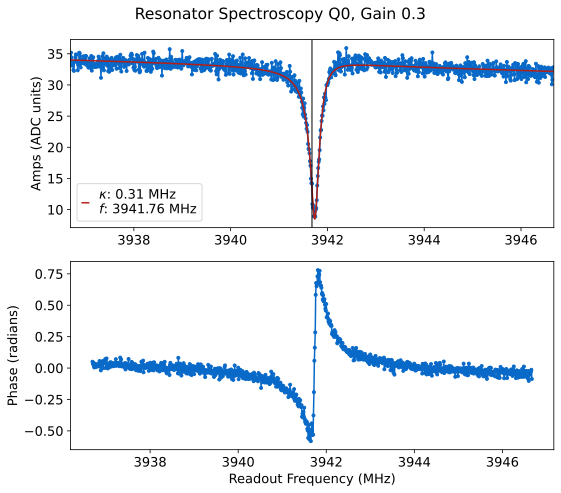

*Set cfg device.readout 0 frequency to 3941.7496 from 3941.6808*
*Set cfg device.readout 0 kappa to 0.3144 from 0.3158*
*Set cfg device.readout 0 qi to 5.0793 from 4.4087*
*Set cfg device.readout 0 qe to 1.6647 from 1.7408*


In [132]:
update=True # Set to true if you want to update the config file with the new resonance values
qubit_list = [0]

for qi in qubit_list:   
    # set up filter and attenuation  
    setup_readout_chain(qi, bw_adc=500, bw_dac=100, atten1_dac=30, atten2_dac=30, atten_adc=30, cfg=auto_cfg, hw=soc)
    # Manually set the span and gain 
    rspec = meas.ResSpec(cfg_dict, qi=qi, params={'span':10, 'gain':0.3, 'reps':1000, 'expts':1001, "final_delay":1})

    # Fully automated, using previous fit to kappa to set span
    # rspec = meas.ResSpec(cfg_dict, qi=qi, params={'span':'kappa'})
    if update: rspec.update()

  0%|          | 0/1001000 [00:00<?, ?it/s]

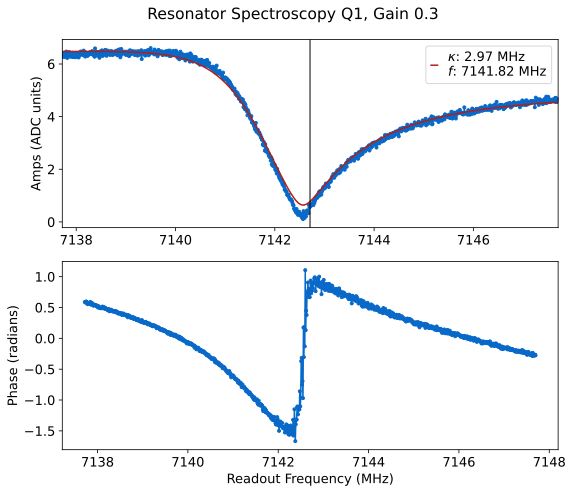

*Set cfg device.readout 1 frequency to 7142.5682 from 7142.7094*
*Set cfg device.readout 1 kappa to 2.9665 from 2.8968*
*Set cfg device.readout 1 qi to 25849609.3308 from 49705915.7554*
*Set cfg device.readout 1 qe to 0.2408 from 0.2465*


In [179]:
update=True # Set to true if you want to update the config file with the new resonance values
qubit_list = [1]

for qi in qubit_list:   
    # set up filter and attenuation  
    setup_readout_chain(qi, bw_adc=500, bw_dac=100, atten1_dac=30, atten2_dac=10, atten_adc=30, cfg=auto_cfg, hw=soc)
    # Manually set the span and gain 
    rspec = meas.ResSpec(cfg_dict, qi=qi, params={'span':10, 'gain':0.3, 'reps':1000, 'expts':1001, "final_delay":1})

    # Fully automated, using previous fit to kappa to set span
    # rspec = meas.ResSpec(cfg_dict, qi=qi, params={'span':'kappa'})
    if update: rspec.update()

  0%|          | 0/1001000 [00:00<?, ?it/s]

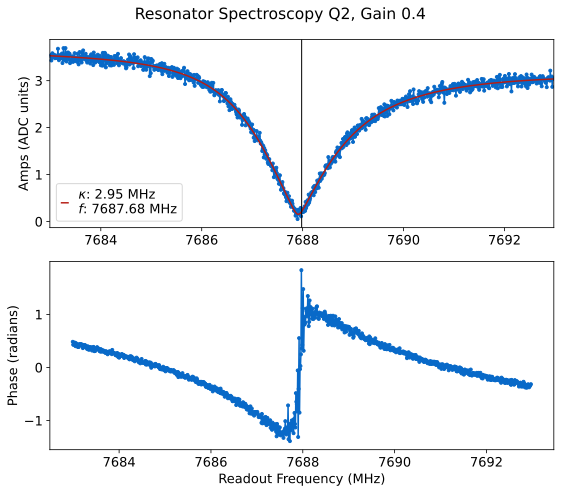

*Set cfg device.readout 2 frequency to 7687.8994 from 7687.9806*
*Set cfg device.readout 2 kappa to 2.9497 from 2.9752*
*Set cfg device.readout 2 qi to 7.6006 from 7.4989*
*Set cfg device.readout 2 qe to 0.2699 from 0.2676*


In [242]:
update=True # Set to true if you want to update the config file with the new resonance values
qubit_list = [2]

for qi in qubit_list:   
    # set up filter and attenuation  
    setup_readout_chain(qi, bw_adc=500, bw_dac=100, atten1_dac=30, atten2_dac=0, atten_adc=30, cfg=auto_cfg, hw=soc)
    # Manually set the span and gain 
    rspec = meas.ResSpec(cfg_dict, qi=qi, params={'span':10, 'gain':0.4, 'reps':1000, 'expts':1001, "final_delay":1})

    # Fully automated, using previous fit to kappa to set span
    # rspec = meas.ResSpec(cfg_dict, qi=qi, params={'span':'kappa'})
    if update: rspec.update()

  0%|          | 0/1001000 [00:00<?, ?it/s]

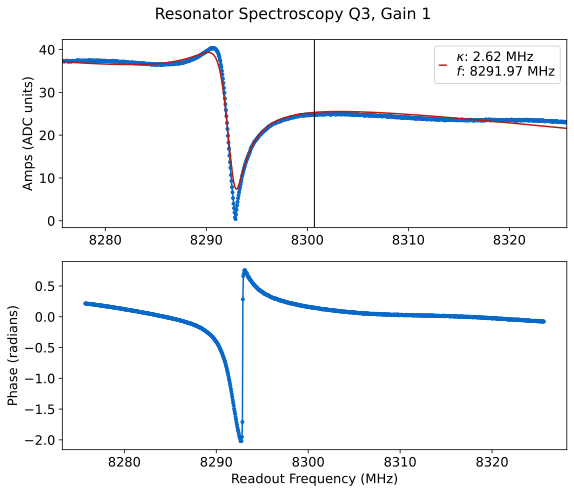

*Set cfg device.readout 3 frequency to 8292.8916 from 8300.6958*
*Set cfg device.readout 3 kappa to 2.6211 from 83.4312*
*Set cfg device.readout 3 qi to 33712862.0122 from 0.016*
*Set cfg device.readout 3 qe to 0.3164 from 0.0265*


In [313]:
update=True # Set to true if you want to update the config file with the new resonance values
qubit_list = [3]

for qi in qubit_list:   
    # set up filter and attenuation  
    setup_readout_chain(qi, bw_adc=1000, bw_dac=100, atten1_dac=0, atten2_dac=0, atten_adc=30, cfg=auto_cfg, hw=soc)
    # Manually set the span and gain 
    rspec = meas.ResSpec(cfg_dict, qi=qi, params={'span':50, 'gain':1, 'reps':1000, 'expts':1001, "final_delay":1})

    # Fully automated, using previous fit to kappa to set span
    # rspec = meas.ResSpec(cfg_dict, qi=qi, params={'span':'kappa'})
    if update: rspec.update()

## Resonator Power Spectroscopy 

Find a good value for gain to park your readout at until you run readout optimization. From the 2D sweep that is produced, choose a value for gain that is right before the resonator punches out. Want to choose a high value for gain because we want to be in the shot noise limited regime which increases our signal:noise ratio. 

  0%|          | 0/100 [00:00<?, ?it/s]

High power peak [MHz]: 3956.5742
Low power peak [MHz]: 3941.6037
Lamb shift [MHz]: 14.9704


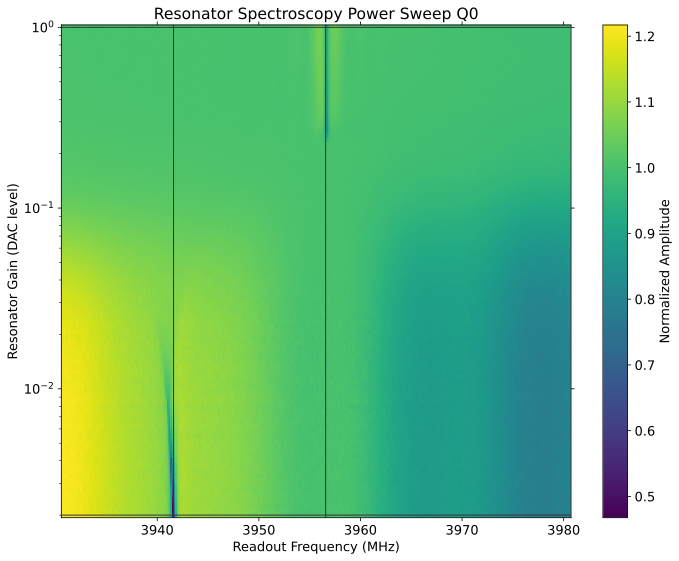

*Set cfg device.readout 0 lamb to 14.9704 from -1.6581*


In [ ]:
update=True

# qubit_list = np.arange(3)
qubit_list=[0]

d=[]
for qi in qubit_list:
    # set up filter and attenuation  
    setup_readout_chain(qi, bw_adc=500, bw_dac=100, atten1_dac=10, atten2_dac=0, atten_adc=30, cfg=auto_cfg, hw=soc)
    
    params={'rng':500,'max_gain': 1,  'span':50,"f_off":1,'expts_gain':100}
    #params={'rng':2000,'max_gain': 1,  'span':300,"f_off":0, 'rounds':3}
    rpowspec=meas.ResSpecPower(cfg_dict, qi=qi, params=params)#, live_plot=True)
    d.append(rpowspec)
    if update:
        auto_cfg = config.update_readout(cfg_path, 'lamb', rpowspec.data['lamb_shift'], qi)

  0%|          | 0/100 [00:00<?, ?it/s]

High power peak [MHz]: 7126.8019
Low power peak [MHz]: 7141.7815
Lamb shift [MHz]: -14.9796


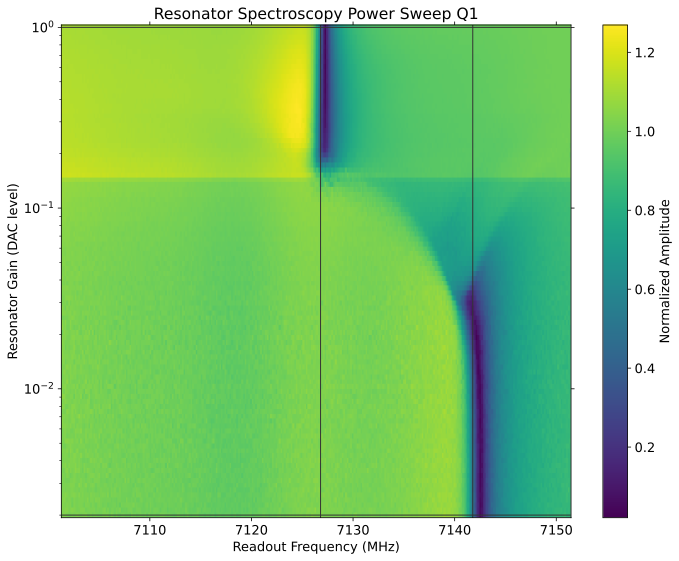

*Set cfg device.readout 1 lamb to -14.9796 from -28.5806*


In [131]:
update=True

# qubit_list = np.arange(3)
qubit_list=[1]

d=[]
for qi in qubit_list:
    # set up filter and attenuation  
    setup_readout_chain(qi, bw_adc=500, bw_dac=100, atten1_dac=10, atten2_dac=0, atten_adc=30, cfg=auto_cfg, hw=soc)
    
    params={'rng':500,'max_gain': 1,  'span':50,"f_off":1,'expts_gain':100}
    #params={'rng':2000,'max_gain': 1,  'span':300,"f_off":0, 'rounds':3}
    rpowspec=meas.ResSpecPower(cfg_dict, qi=qi, params=params)#, live_plot=True)
    d.append(rpowspec)
    if update:
        auto_cfg = config.update_readout(cfg_path, 'lamb', rpowspec.data['lamb_shift'], qi)

  0%|          | 0/100 [00:00<?, ?it/s]

High power peak [MHz]: 7680.4203
Low power peak [MHz]: 7687.8035
Lamb shift [MHz]: -7.3832


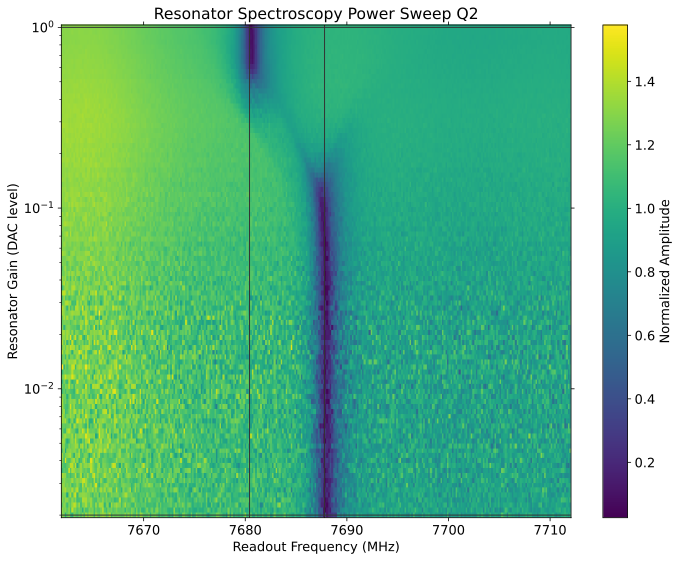

*Set cfg device.readout 2 lamb to -7.3832 from -26.7738*


In [240]:
update=True

# qubit_list = np.arange(3)
qubit_list=[2]

d=[]
for qi in qubit_list:
    # set up filter and attenuation  
    setup_readout_chain(qi, bw_adc=500, bw_dac=100, atten1_dac=10, atten2_dac=0, atten_adc=30, cfg=auto_cfg, hw=soc)
    
    params={'rng':500,'max_gain': 1,  'span':50,"f_off":1,'expts_gain':100}
    #params={'rng':2000,'max_gain': 1,  'span':300,"f_off":0, 'rounds':3}
    rpowspec=meas.ResSpecPower(cfg_dict, qi=qi, params=params)#, live_plot=True)
    d.append(rpowspec)
    if update:
        auto_cfg = config.update_readout(cfg_path, 'lamb', rpowspec.data['lamb_shift'], qi)

  0%|          | 0/100 [00:00<?, ?it/s]

High power peak [MHz]: 8291.9559
Low power peak [MHz]: 8293.7898
Lamb shift [MHz]: -1.8339


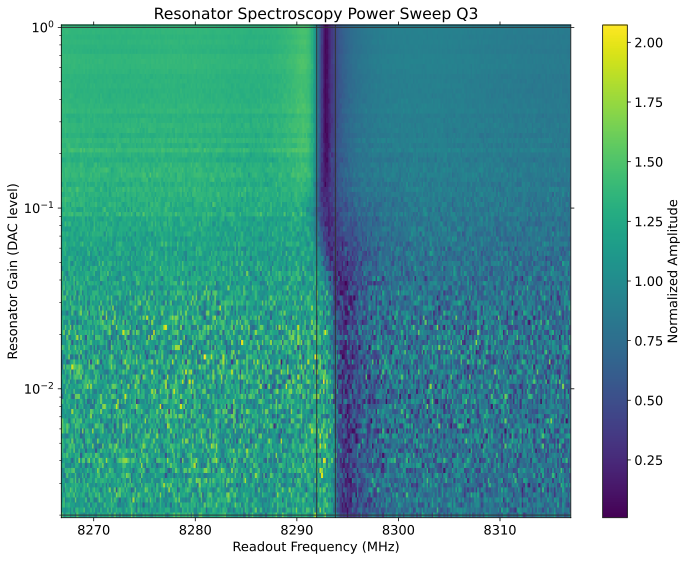

*Set cfg device.readout 3 lamb to -1.8339 from -21.1762*


In [314]:
update=True

# qubit_list = np.arange(3)
qubit_list=[3]

d=[]
for qi in qubit_list:
    # set up filter and attenuation  
    setup_readout_chain(qi, bw_adc=1000, bw_dac=100, atten1_dac=0, atten2_dac=0, atten_adc=30, cfg=auto_cfg, hw=soc)
    
    params={'rng':500,'max_gain': 1,  'span':50,"f_off":1,'expts_gain':100}
    #params={'rng':2000,'max_gain': 1,  'span':300,"f_off":0, 'rounds':3}
    rpowspec=meas.ResSpecPower(cfg_dict, qi=qi, params=params)#, live_plot=True)
    d.append(rpowspec)
    if update:
        auto_cfg = config.update_readout(cfg_path, 'lamb', rpowspec.data['lamb_shift'], qi)

In [241]:
445**2/7.3

27126.712328767124

In [174]:
7140-3226

3914

### Example of plotting 2D scans for a bunch of qubits together
Can also use for varying a parameter on one qubit and plotting the results together

In [ ]:
auto_cfg = config.load(cfg_path)
horz_line = auto_cfg.device.readout.gain
handy.plot_many(d, title='Resonator Power', save_path=cfg_dict['expt_path'], chan='amps', yax='log', norm=True, horz_line=horz_line)

### Save gain values 

In [ ]:
# assign the resonator gain to the results config file
gain_values = [0.1,0.01]
for i, qi in enumerate(qubit_list):
    auto_cfg = config.update_readout(cfg_file, 'gain', gain_values[i], qi)

# Qubit Spectroscopy

## Find qubits
More automated, zooms out and adds power if no peak visible. Best to use if you're feeling confident, otherwise use more manual stuff in next cell. 

In [ ]:
qubit_list= [0]

bad_qubits=[]
for qi in qubit_list:
    status, ntries = qubit_tuning.find_spec(qi, cfg_dict, start='fine')
    if not status:
        bad_qubits.append(qi)

## General search, specify width 

style options: fine, medium, coarse, huge (will change scan width and power)

Uses config values of low_gain (gain to use for finest scan), which sets overall gain for device and spec_gain (set indepedently for each qubit) to decide how much power to apply

You may also just want to do this fully manually by specifiying params. 

In [ ]:
update=True

qubit_list = [0]
for qi in qubit_list: 
    filter_center_freq = 5500
    bw = 500
    # set up filter and attenuation  
    setup_qubit_drive_chain(qi, bw=bw, atten1_dac=0, atten2_dac=0, cfg=auto_cfg, hw=soc, center_freq=filter_center_freq)

    # Default params, just specify style 
    #qspec=meas.QubitSpec(cfg_dict, qi=qi, style='medium',params={"span": 1000, "reps": 10000,"gain": 0.02,  'sep_readout': False})

    # Different examples of params you might give; frequency can be specified as start and span or if no start given, center is f_ge from config
    # qspec=meas.QubitSpec(cfg_dict, qi=qi, style='coarse', params={'span':500})
    start_freq = filter_center_freq - bw/2
    params={'start':start_freq, 'span':bw, 'gain':0.1, 'expts':500,  'sep_readout': False}
    #params={'span':50,'expts':200,'gain':0.06,'sep_readout':True, 'length':3, 'readout_length':10, 'reps':10000}
    #params={'span':500,'expts':600,'gain':0.04, 'sep_readout': True}

    qspec=meas.QubitSpec(cfg_dict, qi=qi, style='fine', params=params)
    #qspec=meas.QubitSpec(cfg_dict, qi=qi, style='fine')

    if update and qspec.status: 
        auto_cfg = config.update_qubit(cfg_path, 'f_ge', qspec.data["best_fit"][2], qi)
        auto_cfg = config.update_qubit(cfg_path, 'kappa',2*qspec.data["best_fit"][3], qi)
    elif update:
        print(f'Bad qubit! qi={qi}')

  0%|          | 0/150000 [00:00<?, ?it/s]

R2:0.023	Fit par error:0.247	 Best fit:b'amps'


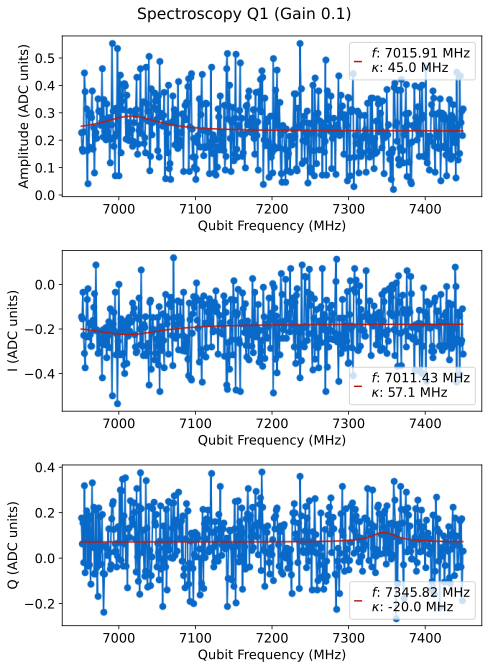

Bad qubit! qi=1


In [234]:
update=True

qubit_list = [1]
for qi in qubit_list: 
    filter_center_freq = 7200
    bw = 500
    # set up filter and attenuation  
    setup_qubit_drive_chain(qi, bw=bw, atten1_dac=0, atten2_dac=0, cfg=auto_cfg, hw=soc, center_freq=filter_center_freq)

    # Default params, just specify style 
    #qspec=meas.QubitSpec(cfg_dict, qi=qi, style='medium',params={"span": 1000, "reps": 10000,"gain": 0.02,  'sep_readout': False})

    # Different examples of params you might give; frequency can be specified as start and span or if no start given, center is f_ge from config
    # qspec=meas.QubitSpec(cfg_dict, qi=qi, style='coarse', params={'span':500})
    start_freq = filter_center_freq - bw/2
    params={'start':start_freq, 'span':bw, 'gain':0.1, 'expts':500,  'sep_readout': False, 'readout_length':10}
    #params={'span':50,'expts':200,'gain':0.06,'sep_readout':True, 'length':3, 'readout_length':10, 'reps':10000}
    #params={'span':500,'expts':600,'gain':0.04, 'sep_readout': True}

    qspec=meas.QubitSpec(cfg_dict, qi=qi, style='fine', params=params)
    #qspec=meas.QubitSpec(cfg_dict, qi=qi, style='fine')

    if update and qspec.status: 
        auto_cfg = config.update_qubit(cfg_path, 'f_ge', qspec.data["best_fit"][2], qi)
        auto_cfg = config.update_qubit(cfg_path, 'kappa',2*qspec.data["best_fit"][3], qi)
    elif update:
        print(f'Bad qubit! qi={qi}')

  0%|          | 0/150000 [00:00<?, ?it/s]

R2:0.009	Fit par error:0.406	 Best fit:b'avgi'
Error saving dataset 'hist_fit': Object dtype dtype('O') has no native HDF5 equivalent


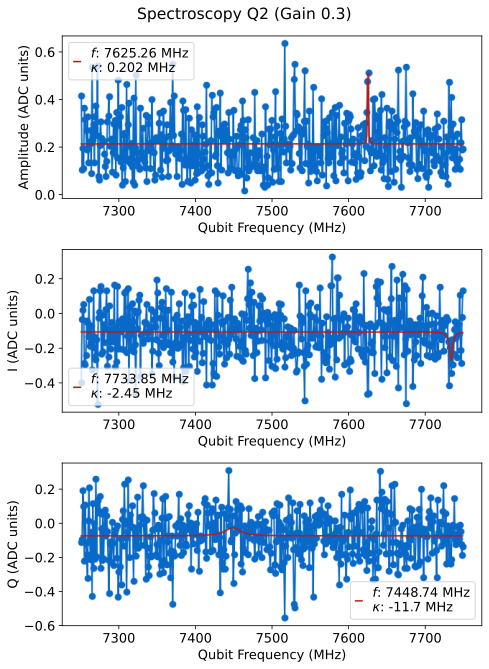

Bad qubit! qi=2


In [273]:
update=True

qubit_list = [2]
for qi in qubit_list: 
    filter_center_freq = 7500
    bw = 500
    # set up filter and attenuation  
    setup_qubit_drive_chain(qi, bw=bw, atten1_dac=0, atten2_dac=0, cfg=auto_cfg, hw=soc, center_freq=filter_center_freq)

    # Default params, just specify style 
    #qspec=meas.QubitSpec(cfg_dict, qi=qi, style='medium',params={"span": 1000, "reps": 10000,"gain": 0.02,  'sep_readout': False})

    # Different examples of params you might give; frequency can be specified as start and span or if no start given, center is f_ge from config
    # qspec=meas.QubitSpec(cfg_dict, qi=qi, style='coarse', params={'span':500})
    start_freq = filter_center_freq - bw/2
    params={'start':start_freq, 'span':bw, 'gain':0.3, 'expts':500,  'sep_readout': False}
    #params={'span':50,'expts':200,'gain':0.06,'sep_readout':True, 'length':3, 'readout_length':10, 'reps':10000}
    #params={'span':500,'expts':600,'gain':0.04, 'sep_readout': True}

    qspec=meas.QubitSpec(cfg_dict, qi=qi, style='fine', params=params)
    #qspec=meas.QubitSpec(cfg_dict, qi=qi, style='fine')

    if update and qspec.status: 
        auto_cfg = config.update_qubit(cfg_path, 'f_ge', qspec.data["best_fit"][2], qi)
        auto_cfg = config.update_qubit(cfg_path, 'kappa',2*qspec.data["best_fit"][3], qi)
    elif update:
        print(f'Bad qubit! qi={qi}')

In [165]:
3941+560

4501

In [149]:
3941*3/2

5911.5

## Stark (still getting it working)

In [ ]:
qi=0
params={'df_stark':0, 'max_stark_gain':0.008, 'df':-12,'span':40, 'stark_expts':50,'stark_rng':50}
stark_spec=meas.StarkSpec(cfg_dict, qi=qi, style='medium', params=params)

In [517]:
stark_spec.data

{'xpts': array([4565.65800047, 4565.85900496, 4566.06000944, 4566.26101393,
        4566.46201841, 4566.6630229 , 4566.86402739, 4567.06503187,
        4567.26603636, 4567.46704084, 4567.66804533, 4567.86904982,
        4568.0700543 , 4568.27105879, 4568.47206327, 4568.67306776,
        4568.87407225, 4569.07507673, 4569.27608122, 4569.4770857 ,
        4569.67809019, 4569.87909468, 4570.08009916, 4570.28110365,
        4570.48210814, 4570.68311262, 4570.88411711, 4571.08512159,
        4571.28612608, 4571.48713057, 4571.68813505, 4571.88913954,
        4572.09014402, 4572.29114851, 4572.492153  , 4572.69315748,
        4572.89416197, 4573.09516645, 4573.29617094, 4573.49717543,
        4573.69817991, 4573.8991844 , 4574.10018888, 4574.30119337,
        4574.50219786, 4574.70320234, 4574.90420683, 4575.10521132,
        4575.3062158 , 4575.50722029, 4575.70822477, 4575.90922926,
        4576.11023375, 4576.31123823, 4576.51224272, 4576.7132472 ,
        4576.91425169, 4577.11525618, 45

In [ ]:
qi=0
params={'df_stark':0, 'max_stark_gain':0.1, 'df':-30,'span':130, 'stark_expts':50,'stark_rng':50}
stark_spec=meas.StarkSpec(cfg_dict, qi=qi, style='medium', params=params)

In [ ]:
auto_cfg_model = config.load(cfg_file_path[:-4] + '_model.yml')
auto_cfg= config.load(cfg_file_path)

k = stark_spec.data['ng2']/auto_cfg_model['g_chi'][qi]
nphotons = auto_cfg['device']['readout']['gain'][qi]**2*k

## Qubit power sweep

In [51]:
5454.6218/2

2727.3109

  0%|          | 0/10 [00:00<?, ?it/s]

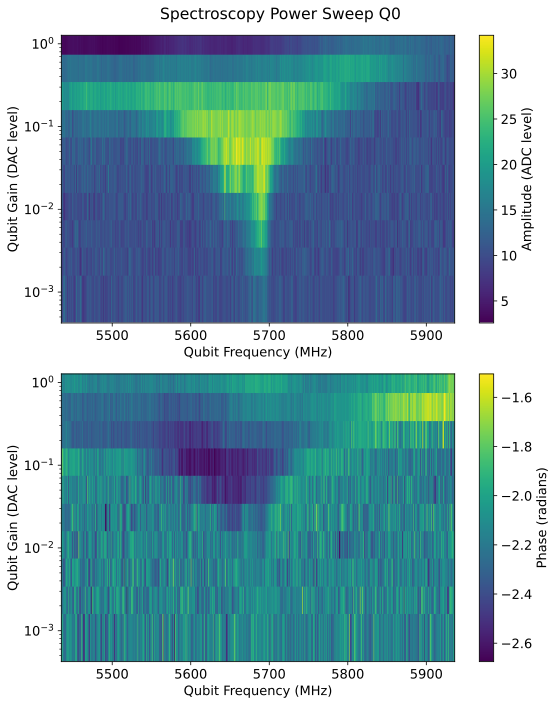

In [ ]:
qubit_list=[0]

d = []
for qi in qubit_list:
    # set up filter a`nd attenuation  
    filter_center_freq = 4500
    bw = 500
    # set up filter and attenuation  
    setup_qubit_drive_chain(qi, bw=bw, atten1_dac=0, atten2_dac=0, cfg=auto_cfg, hw=soc, center_freq=filter_center_freq)

    #params={'start':6050,'span':300,'expts':200, 'max_gain':1, 'rng':100,"expts_gain": 22, 'length':1,'sep_readout':True, 'reps':5000}
    params={'start':2675,'span':100}#,'expts':200, 'max_gain':1, 'rng':100,"expts_gain": 22, 'length':1,'sep_readout':True, 'reps':5000}
    # params={'sep_readout':False,'rng':1000,'span':500}
    #qspec_pow = meas.QubitSpecPower(cfg_dict, qi=qi, style='', params=params)
    qspec_pow = meas.QubitSpecPower(cfg_dict, qi=qi, style='coarse', params=params)
    d.append(qspec_pow)
    #qspec_pow = meas.QubitSpecPower(cfg_dict, qi=qi, style='', params={'start':3700,'span':600,'reps':1500,'expts':1200, 'max_gain':0.4, 'length':1,'sep_readout':True})
# handy.plot_many(d, title='Qubit Power')

  0%|          | 0/10 [00:00<?, ?it/s]

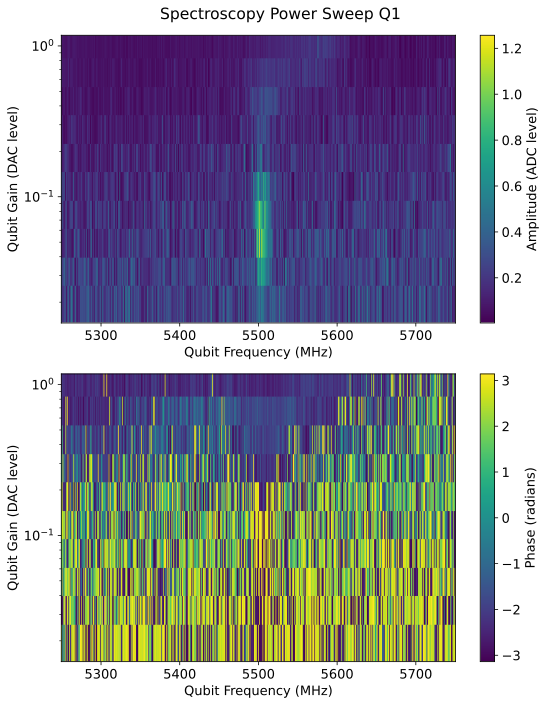

In [226]:
qubit_list=[1]

d = []
for qi in qubit_list:
    # set up filter a`nd attenuation  
    filter_center_freq = 5500
    bw = 500
    # set up filter and attenuation  
    setup_qubit_drive_chain(qi, bw=bw, atten1_dac=0, atten2_dac=0, cfg=auto_cfg, hw=soc, center_freq=filter_center_freq)
    
    #params={'start':6050,'span':300,'expts':200, 'max_gain':1, 'rng':100,"expts_gain": 22, 'length':1,'sep_readout':True, 'reps':5000}
    start_freq = filter_center_freq - bw/2
    params={'start':start_freq,'span':bw,'expts':500,'sep_readout':False, 'readout_length':10}#,'expts':200, 'max_gain':1, 'rng':100,"expts_gain": 22, 'length':1, 'reps':5000}
    # params={'sep_readout':False,'rng':1000,'span':500}
    #qspec_pow = meas.QubitSpecPower(cfg_dict, qi=qi, style='', params=params)
    qspec_pow = meas.QubitSpecPower(cfg_dict, qi=qi, style='coarse', params=params)
    d.append(qspec_pow)
    #qspec_pow = meas.QubitSpecPower(cfg_dict, qi=qi, style='', params={'start':3700,'span':600,'reps':1500,'expts':1200, 'max_gain':0.4, 'length':1,'sep_readout':True})
# handy.plot_many(d, title='Qubit Power')

  0%|          | 0/10 [00:00<?, ?it/s]

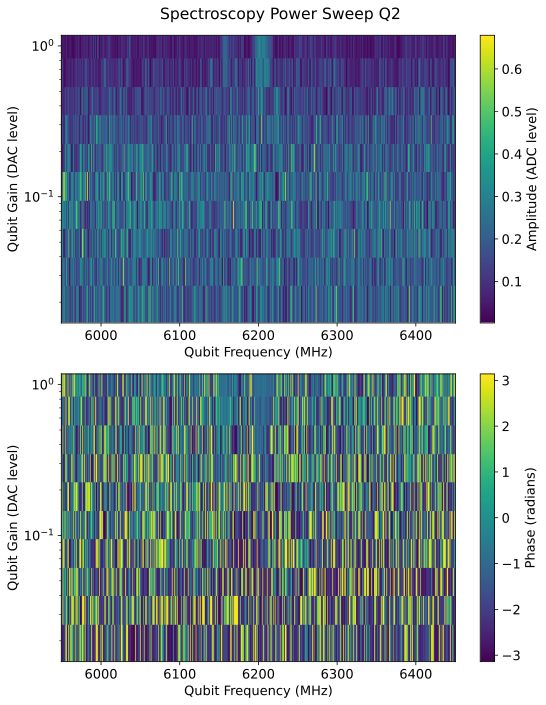

In [264]:
qubit_list=[2]

d = []
for qi in qubit_list:
    # set up filter a`nd attenuation  
    filter_center_freq = 6200
    bw = 500
    # set up filter and attenuation  
    setup_qubit_drive_chain(qi, bw=bw, atten1_dac=0, atten2_dac=0, cfg=auto_cfg, hw=soc, center_freq=filter_center_freq)
    
    #params={'start':6050,'span':300,'expts':200, 'max_gain':1, 'rng':100,"expts_gain": 22, 'length':1,'sep_readout':True, 'reps':5000}
    start_freq = filter_center_freq - bw/2
    params={'start':start_freq,'span':bw,'expts':500,'sep_readout':False, 'readout_length':10}#,'expts':200, 'max_gain':1, 'rng':100,"expts_gain": 22, 'length':1, 'reps':5000}
    # params={'sep_readout':False,'rng':1000,'span':500}
    #qspec_pow = meas.QubitSpecPower(cfg_dict, qi=qi, style='', params=params)
    qspec_pow = meas.QubitSpecPower(cfg_dict, qi=qi, style='coarse', params=params)
    d.append(qspec_pow)
    #qspec_pow = meas.QubitSpecPower(cfg_dict, qi=qi, style='', params={'start':3700,'span':600,'reps':1500,'expts':1200, 'max_gain':0.4, 'length':1,'sep_readout':True})
# handy.plot_many(d, title='Qubit Power')

### Sweep pulse length 
Useful when t1 low

sep_readout = False measures at same time as probe pulse (default is True)

In [ ]:
length = [1,3,5,10]
for l in length:
    for qi in qubit_list:
        params={'start':3000,'span':600,'reps':1500,'expts':1200, 'max_gain':0.4, 'length':1,'sep_readout':True}
        params={'start':4000,'span':200,'expts':300,'length':l}
        qspec_pow = meas.QubitSpecPower(cfg_dict, qi=qi, style='', params=params)
        #qspec_pow = meas.QubitSpecPower(cfg_dict, qi=qi, style='', params=params)

### Narrow scan

In [ ]:
qq=[]

# qubit_list = np.arange(3)
qubit_list=[2]
for qi in qubit_list:
    qspec_pow = meas.QubitSpecPower(cfg_dict, qi=qi, style='narrow')#, live_plot=True)
    
    # Nice for pretty pics once you have T1 measurement. 
    #qspec_pow = meas.QubitSpecPower(cfg_dict, qi=qi, style='fine', params={'length':'t1','max_gain':1})
    qq.append(qspec_pow)

# When measuring many qubits, can do a bunch of color plots this way
#handy.plot_many(qq, title='Qubit Power Amps 0.6-0.2', save_path=cfg_dict['expt_path'], yax='log', chan='amps')
#handy.plot_many(qq, title='Qubit Power Phase 0.6-0.2', save_path=cfg_dict['expt_path'], yax='log', chan='phases')

### Multiple wide scans looking for qubit

In [ ]:
qubit_list = np.arange(3)
qubit_list=[1]

span = 250
start_all = [2000, 3100, 3400]
end_all = [4780, 3700, 4250]
sensitivities = [0.8, 0.4, 0.2]

d = []
for qi in tqdm(qubit_list, desc='Qubit Number'):
    starts = np.arange(start_all[qi], end_all[qi], span)
    qresults = []
    for start in tqdm(starts, desc=f'Start Frequency Sweep'):
        q_res = meas.QubitSpecPower(
            cfg_dict, 
            qi=qi, 
            style='coarse', 
            params={
                'max_gain':0.8,
                'start':start,
                'span':span,
                'rng':100,
                'reps':800}
        )#,'start':3000,'span':300'})
        qresults.append(q_res)
    
    # Handy plot
    handy.plot_many_limited(
        qresults, 
        title=f'Qubit Power for qubit {qi}', 
        save_path=cfg_dict['expt_path'],
        yax='log', 
        chan='amps', 
        individial_fig_size= (6,6), 
        xlabel='Frequency (MHz)',
        sensitivity =  sensitivities[qi],
        save = False,
    )
    d.append(q_res)
    plt.show()

# Coherent scans

## Fast tuneup

Options are: 

first_time: assume we don't know t1 time,don't have single shot working

single: do single shot readout optimization 

readout: set readout frequency based on resonator fit

In [ ]:
# qubit_list = np.arange(3)
qubit_list=[1]


#qubit_list=np.delete(qubit_list, [5,13])
# Worst issue with this right now is when the qubit frequency is not correct and readout is bad;
# gets stuck doing ramsey/spectroscopy forever. In this case, cancel it and go back to find qubits, 
# try changing readout gain. 
plt.rcParams.update({'font.size': 11})
for qi in qubit_list: 
    qubit_tuning.tune_up_qubit(qi, cfg_dict, first_time=False, single=False, readout=True)

## Time tracking
fast = True only measures T2 and T1, otherwise does full set of scans.

In [ ]:
scan_length = 24 #  hours 

qubit_list = [0]
tt, csv_pth, tt_stats = time_tracking(qubit_list, cfg_dict,display=False,total_time=scan_length, fast=True)

In [ ]:
from slab_qick_calib.analysis import allan 

allan.perform_analysis(np.array(tt[0]['time']), np.array(tt[0]['t1']),'hi')

In [ ]:
qubit_params.stats(cfg_path, tt_stats, qubit_list)

In [48]:
setup_qubit_drive_chain(qi, bw=100, atten1_dac=0, atten2_dac=0, cfg=auto_cfg, hw=soc)


{'DAC_ch': 1, 'drive_freq': 4597.6534}

## Rabi

### Amplitude

Uses gain/sigma set in pulses part of config

Unexpected parameters found in params: {'sigma'}


  0%|          | 0/200000 [00:00<?, ?it/s]

R2:-0.330	Fit par error:0.047	 Best fit:b'avgq'


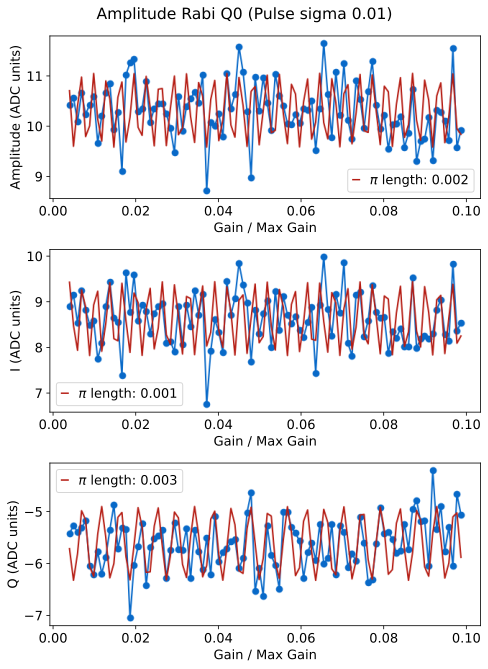

In [ ]:
# qubit_list = np.arange(3)
qubit_list=[0]

update=True

for qi in qubit_list: 
    # amp_rabi = meas.RabiExperiment(cfg_dict,qi=qi)#, disp_kwargs={'show_hist':True})
    
    # Fully customized version
    amp_rabi = meas.RabiExperiment(cfg_dict,qi=qi, params={'expts':100, "sigma":0.01,'max_gain':0.1,'reps':2000})#, disp_kwargs={'show_hist':True})

    if update and amp_rabi.status:
        config.update_qubit(cfg_path, ('pulses','pi_ge','gain'), amp_rabi.data['pi_length'], qi)
        

### Many pi pulses rabi

In [ ]:
qi=1
update=False

amp_rabi = meas.RabiExperiment(cfg_dict,qi=qi, params={'n_pulses':15})
if update and amp_rabi.status:
    ind = np.argmax(amp_rabi.fitfunc(amp_rabi.data['xpts'], *amp_rabi.data['best_fit']))
    config.update_qubit(cfg_path, ('pulses','pi_ge','gain'), amp_rabi.data['xpts'][ind], qi);

#### Amp Chevron

In [ ]:
d2=[]
#qubit_list = np.arange(3)
qubit_list=[0]
for qi in qubit_list: 
    amp_rabi_chevron = meas.RabiChevronExperiment(cfg_dict,qi=qi, params={'span_f':50})#, params={'span_f':150,'sigma':0.25,'expts_f':100,'expts':100})

    #amp_rabi_chevron = meas.RabiChevronExperiment(cfg_dict,qi=qi, params={'span_f':10, 'expts_f':20, 'checkEF':True})#, live_plot=True)
    d2.append(amp_rabi_chevron)

#handy.plot_many(d2, title='Rabi Chevron Phase', save_path=cfg_dict['expt_path'], chan='phases')

In [ ]:
amp_rabi_chevron.display(plot_both=True)

### Length -- Uses const pulses so do not use to set up pi pulses

Cannot do fast sweep with gaussian pulses due to multiplying qickparams issues; so need the "loop:True" for those, will make everything slower. 

  0%|          | 0/120000 [00:00<?, ?it/s]

R2:0.682	Fit par error:0.072	 Best fit:b'avgi'


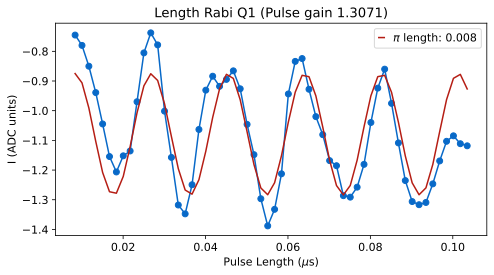

In [460]:
qubit_list = [1]
for qi in qubit_list: 
    # Needs to have params of sweep: length and type: cons
    #len_rabi = meas.RabiExperiment(cfg_dict,qi=qi, params={'sweep':'length', 'pulse_type':'gauss','loop':True})
    len_rabi = meas.RabiExperiment(cfg_dict,qi=qi, params={'sweep':'length', 'pulse_type':'const', 'max_length':0.2})

#### Length Chevron

In [ ]:
qubit_list = np.arange(3)
qubit_list=[0]
for qi in qubit_list: 
    #len_rabi = meas.RabiChevronExperiment(cfg_dict,qi=qi, params={'sweep':'length',"pulse_type":"const"})
    len_rabi = meas.RabiChevronExperiment(cfg_dict,qi=qi, params={'sweep':'length',"pulse_type":"const", 'length':0.2205, 'expts_f':40})
    #len_rabi = meas.RabiChevronExperiment(cfg_dict,qi=qi, params={'sweep':'length',"type":"const", 'sigma':0.205, 'expts_f':60, 'span_f':150, 'gain':0.4,'start_f':6280,'rounds':4})

## Ramsey

In [ ]:
qubit_list=[0]
update = True

for qi in qubit_list:
    t2r = meas.T2Experiment(cfg_dict, qi=qi, max_err=10)

    # Manually configured
    #t2r = meas.T2Experiment(cfg_dict, qi=qi, max_err=10, params = {'expts':300, 'span':10,'start':0.01})#, disp_kwargs={'show_hist':True})
    #t2r = meas.T2Experiment(cfg_dict, qi=qi, max_err=10, params = {'ramsey_freq':1,'expts':100, 'span':10,'start':0.01})
    if t2r.status and update:
        config.update_qubit(cfg_path, 'f_ge', t2r.data['new_freq'], qi)
        auto_cfg = config.update_qubit(cfg_path, 'T2r', t2r.data['best_fit'][3], qi, rng_vals=[1.5, max_t1], sig=2)
    else:
        print('T2 Ramsey fit failed')

### Use Ramsey to recenter

In [ ]:
qubit_list = [0]
for qi in qubit_list:
    status = qubit_tuning.recenter(qi,cfg_dict)            

### Ramsey coherence

In [ ]:
t1= qubit_tuning.get_coherence(meas.RamseyExperiment, qi, cfg_dict,par='T2r')

## T1

If it's the first time, also set T2r and T2e as guesses 


  0%|          | 0/60000 [00:00<?, ?it/s]

R2:0.096	Fit par error:4654.971	 Best fit:b'amps'


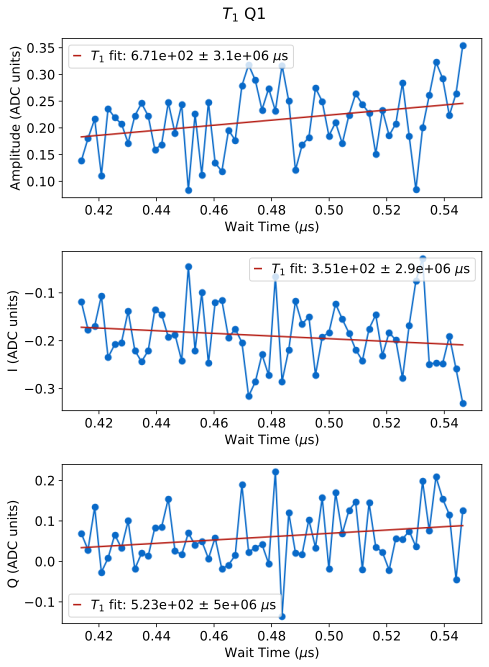

In [227]:
update=True
first_time=True

# qubit_list = np.arange(3)
qubit_list=[1]
for qi in qubit_list:
    #t1 = meas.T1Experiment(cfg_dict, qi=qi)
    t1 = meas.T1Experiment(cfg_dict, qi=qi, params={'reps':1000,'span':0.2, 'start':0})#, disp_kwargs={'show_hist':True})
    #t1 = meas.T1Experiment(cfg_dict, qi=qi, disp_kwargs={'show_hist':True})

    if update: t1.update(first_time=first_time)

### T1 coherence

Runs scan until scan is properly configured to be sensitive to T1

In [ ]:
qi=0
qubit_tuning.get_coherence(meas.T1Experiment,qi=qi,cfg_dict=cfg_dict,par='T1')

### Continuous scan at single point
Times do not seem to be accurate right now 

In [ ]:
qi=0
t1cont = meas.T1ContExperiment(cfg_dict,qi=qi, params={'shots':120000})

In [ ]:
t1cont.display(filter_type='boxcar')

In [ ]:
t1cont = meas.T1ContExperiment(cfg_dict,qi=qi, params={'shots':8000000})
t1cont = meas.T1ContExperiment(cfg_dict,qi=qi, params={'shots':8000000})

In [ ]:
float(t1cont.data['times'][2]-t1cont.data['times'][1])/10

In [ ]:
len(t1cont.data['t1_estimates'])
t1_data = t1cont.data['t1_estimates']

from slab_qick_calib.analysis import time_series
sampling_rate = 1/ float(t1cont.data['times'][2]-t1cont.data['times'][1])
print(f'Sampling rate is {sampling_rate} Hz')
nperseg = min(2048, int(2 ** np.floor(np.log2(len(t1_data) / 4))))

time_series.analyze_qubit_psd(
    t1_data, fs=sampling_rate, nperseg=nperseg
)

plt.figure()
plt.plot(t1cont.data['times'], t1cont.data['t1_estimates'], '.-')

In [ ]:
from slab_qick_calib.analysis import allan 

allan.perform_analysis(t1cont.data['times'], t1cont.data['t1_estimates'],'hi')

In [ ]:

nan_inds = np.where(np.isnan(t1cont.data['t1_estimates']))[0]

times = np.delete(t1cont.data['times'], nan_inds)
t1_data = np.delete(t1cont.data['t1_estimates'], nan_inds)

In [ ]:
allan.perform_analysis(times, t1_data,'hi')

In [ ]:
float(t1cont.data['times'][2]-t1cont.data['times'][1])

### T1 continuous 2Q

In [ ]:
qi = [10,0]
meas.T1_2Q(cfg_dict,qi=qi, )

In [ ]:
qi=[0,10]
scan_time = 0.1 #hours
number_of_scans = 1
shots = int(100000*scan_time*60/4)
print(shots)
for i in range(number_of_scans):
    meas.T1Cont2QExperiment(cfg_dict,qi=qi, params={'shots':shots, 'active_reset':False})

## Echo and more

  0%|          | 0/40000 [00:00<?, ?it/s]

R2:0.965	Fit par error:0.023	 Best fit:b'avgi'


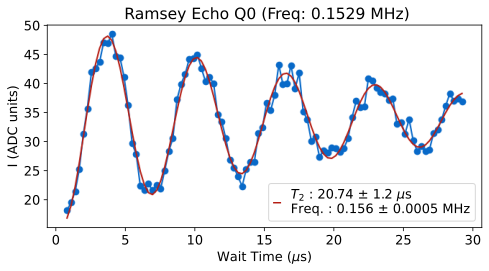

*Set cfg device.qubit 0 T2e to 20.74 from 9.81*


In [73]:
qubit_list = np.arange(3)
qubit_list=[0]
update=True
for qi in qubit_list:
    # Need to have experiment type set to echo
    t2e = meas.T2Experiment(cfg_dict, qi=qi, params={'experiment_type':'echo'})
    #t2e = meas.T2Experiment(cfg_dict, qi=qi, params={'experiment_type':'echo', 'span':20, 'expts':100})
    if t2e.status and update:
        auto_cfg = config.update_qubit(cfg_path, 'T2e', t2e.data['best_fit'][3], qi,sig=2, rng_vals=[1.5, max_t1*2])

### More pi / CPMG
Breaks above 12 right now; need to make it a python loop 

  0%|          | 0/40000 [00:00<?, ?it/s]

R2:0.940	Fit par error:0.028	 Best fit:b'avgi'


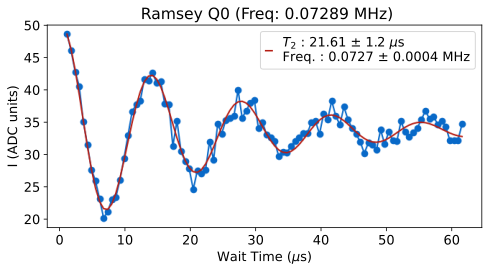

  0%|          | 0/40000 [00:00<?, ?it/s]

R2:0.879	Fit par error:0.044	 Best fit:b'avgi'


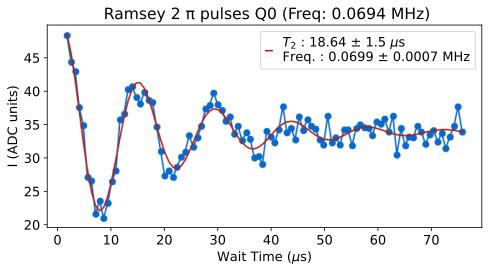

  0%|          | 0/40000 [00:00<?, ?it/s]

R2:0.912	Fit par error:0.041	 Best fit:b'avgi'


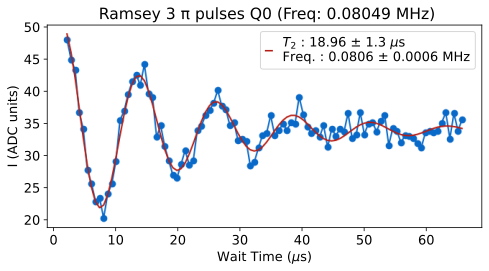

  0%|          | 0/40000 [00:00<?, ?it/s]

R2:0.923	Fit par error:0.058	 Best fit:b'avgi'


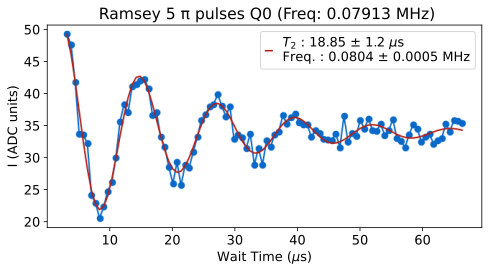

  0%|          | 0/40000 [00:00<?, ?it/s]

R2:0.930	Fit par error:0.029	 Best fit:b'avgi'


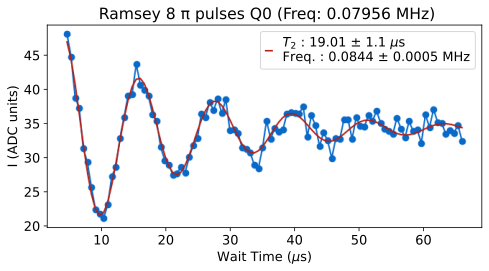

  0%|          | 0/40000 [00:00<?, ?it/s]

R2:0.914	Fit par error:0.037	 Best fit:b'avgi'


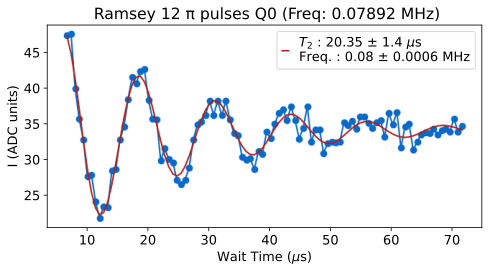

In [75]:
qubit_list = np.arange(3)
qubit_list=[0]
update=True
nums_pi = [1,2,3,5,8,12]
t2_list = []
for qi in qubit_list:
    for pi in nums_pi:
        # Need to have experiment type set to echo
        #params=params={'experiment_type':'cpmg','num_pi':pi, 'span':400, 'ramsey_freq':0.02, 'reps':500}
        params=params={'experiment_type':'cpmg','num_pi':pi,}
        if pi>1:
            params['span']= t2e.data['fit_avgi'][3]*3.5
            params['ramsey_freq']=1.5/t2e.data['fit_avgi'][3]


        t2e = meas.T2Experiment(cfg_dict, qi=qi, params=params)
        t2_list.append(t2e.data['best_fit'][3])


Text(0.5, 0, '1/Number of pi pulses')

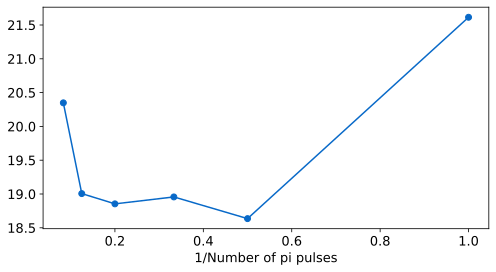

In [76]:
plt.figure()
plt.plot(1/np.array(nums_pi), t2_list, 'o-')
plt.xlabel('1/Number of pi pulses')

### Get echo coherence

In [ ]:
qi=6
t2e = qubit_tuning.get_coherence(meas.RamseyEchoExperiment, qi, cfg_dict,'T2e')

## Feedback checks

In [ ]:
qi=0
# This makes sure that waits are set correctly for active reset so that you get the same value from the buffer as ... 
reset = meas.MemoryExperiment(cfg_dict, qi=qi, params={'shots':1, 'expts':10})

In [ ]:
# Don't do the active reset, just do the repeated measurement 
qi=1
shot = meas.RepMeasExperiment(cfg_dict, qi=qi, params={'shots':10000,'active_reset':False, 'setup_reset':False})
shot.check_reset()

In [ ]:

np.mean(shot.data['Ig'])
np.mean(shot.data['Ie'])

# Single Shot

  0%|          | 0/10000 [00:00<?, ?it/s]

  0%|          | 0/10000 [00:00<?, ?it/s]

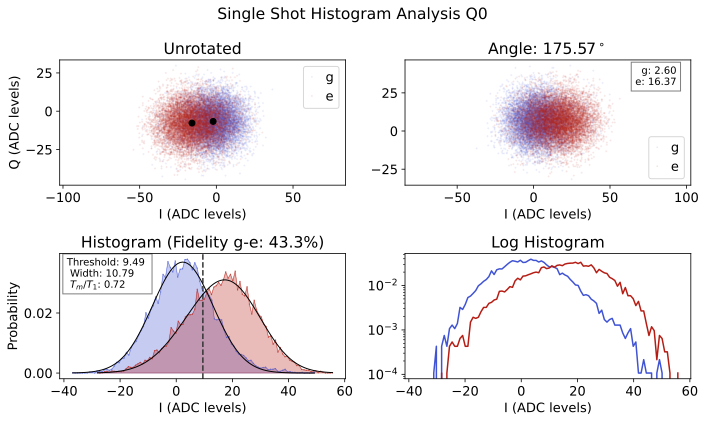

*Set cfg device.readout 0 phase to 175.5712 from 176.412*
*Set cfg device.readout 0 threshold to 9.4874 from 10.069*
*Set cfg device.readout 0 fidelity to 0.4328 from 0.4322*
*Set cfg device.readout 0 sigma to 10.7882 from 10.7685*
*Set cfg device.readout 0 tm to 0.7245 from 0.744*
*Set cfg device.qubit 0 tuned_up to True from True*


In [91]:
# Single shot 
qubit_list = np.arange(3)
qubit_list =[0]

for qi in qubit_list:
    shot=meas.HistogramExperiment(cfg_dict, qi=qi)

    # Configure number of shots
    #shot=meas.HistogramExperiment(cfg_dict, qi=qi, params={'shots':30000})
    shot.update()

### Adjust reps for fidelity 

In [386]:
max_inc = 20 # dont' let it do more than 15x standard number of reps so that things don't take forever
qubit_list = [0]

auto_cfg = config.load(cfg_path)
for qi in qubit_list:
    config.update_readout(cfg_path, 'reps', 1/auto_cfg['device']['readout']['fidelity'][qi]**1.5, qi, rng_vals=[1,max_inc]);

*Set cfg device.readout 0 reps to 3.0966 from 2.9262*


## Readout opt

### General sweep

Runs single shot experiments for many readout lengths, frequencies, gains and compares fidelity

low_gain=True chooses lowest gain/readout length within a few percent of maximum gain (often readout fidelity fairly flat as a function of gain at higher gain values) 

style='fine' varies parameters by 20%, style='' varies by 2x

Unexpected parameters found in params: {'step_len', 'step_gain', 'step_f'}


  0%|          | 0/12 [00:00<?, ?it/s]

Max fidelity 45.264 %
Optimal params: 
 Freq (MHz) 5454.766 
 Gain (DAC units) 1.000 
 Readout length (us) 20.416
Not all elements in fid_expts are odd.
Set fidelity: 43.844 %
Set params: 
 Freq (MHz) 5454.677 
 Gain (DAC units) 1.000 
 Readout length (us) 20.416


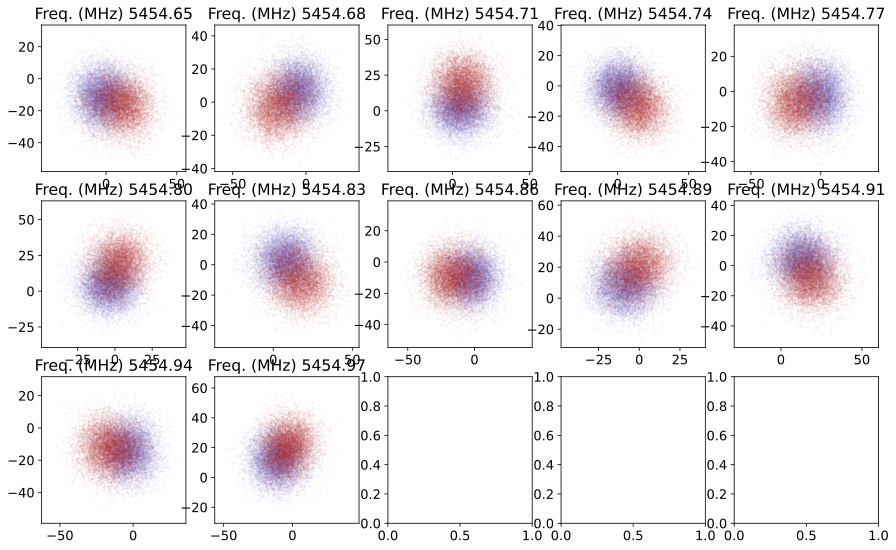

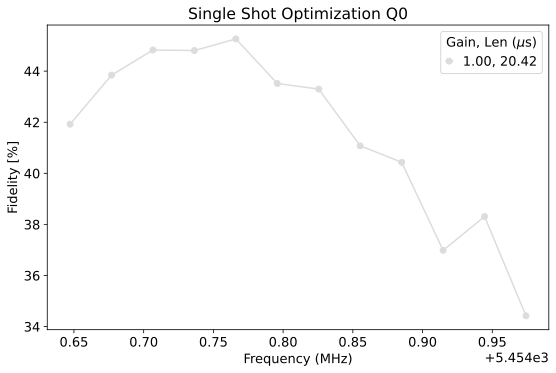

Max fidelity 45.264 %
Optimal params: 
 Freq (MHz) 5454.766 
 Gain (DAC units) 1.000 
 Readout length (us) 20.416
Not all elements in fid_expts are odd.
*Set cfg device.readout 0 gain to 1.0 from 1.0*
*Set cfg device.readout 0 readout_length to 20.4158 from 20.4158*
*Set cfg device.readout 0 frequency to 5454.7661 from 5454.8107*


  0%|          | 0/10000 [00:00<?, ?it/s]

  0%|          | 0/10000 [00:00<?, ?it/s]

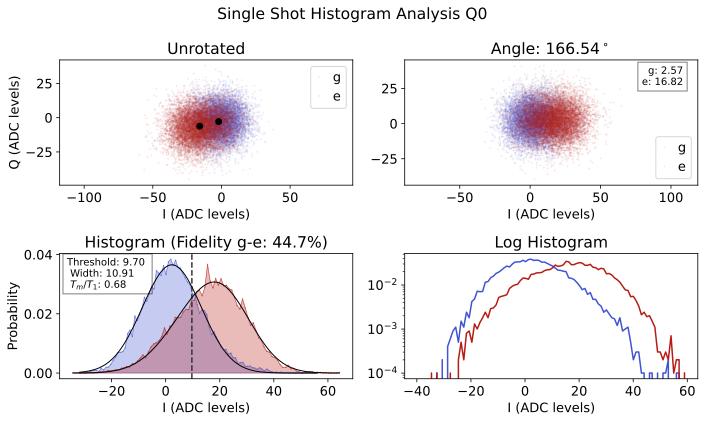

*Set cfg device.readout 0 phase to 166.5435 from 175.5712*
*Set cfg device.readout 0 threshold to 9.6974 from 9.4874*
*Set cfg device.readout 0 fidelity to 0.4469 from 0.4328*
*Set cfg device.readout 0 sigma to 10.9136 from 10.7882*
*Set cfg device.readout 0 tm to 0.6822 from 0.7245*
*Set cfg device.qubit 0 tuned_up to True from True*


In [92]:
update=True
low_gain=False

qubit_list=np.arange(3)
qubit_list=[0]

#params = {'expts_f':1, 'expts_gain':5, 'expts_len':5}
params = {'expts_f':12, 'expts_gain':1, 'expts_len':1}

# Specify exact ranges to use  
#params = {'expts_f':1, 'expts_gain':9, 'expts_len':9,'start_gain':0.45, 'span_gain':0.05,'start_len':2, 'span_len':5}

for qi in qubit_list: 
    shotopt=meas.SingleShotOptExperiment(cfg_dict, qi=qi,params=params)#, style='fine')
    shotopt.analyze(low_gain=low_gain)
    if update: shotopt.update(cfg_dict['cfg_file'])

    shot=meas.HistogramExperiment(cfg_dict, qi=qi)
    shot.update()

### Run optimization until it converges

Unexpected parameters found in params: {'step_gain', 'step_f', 'step_len'}


  0%|          | 0/5 [00:00<?, ?it/s]

Max fidelity 68.092 %
Optimal params: 
 Freq (MHz) 5454.347 
 Gain (DAC units) 0.787 
 Readout length (us) 12.152
Set fidelity: 65.479 %
Set params: 
 Freq (MHz) 5454.347 
 Gain (DAC units) 0.575 
 Readout length (us) 12.152


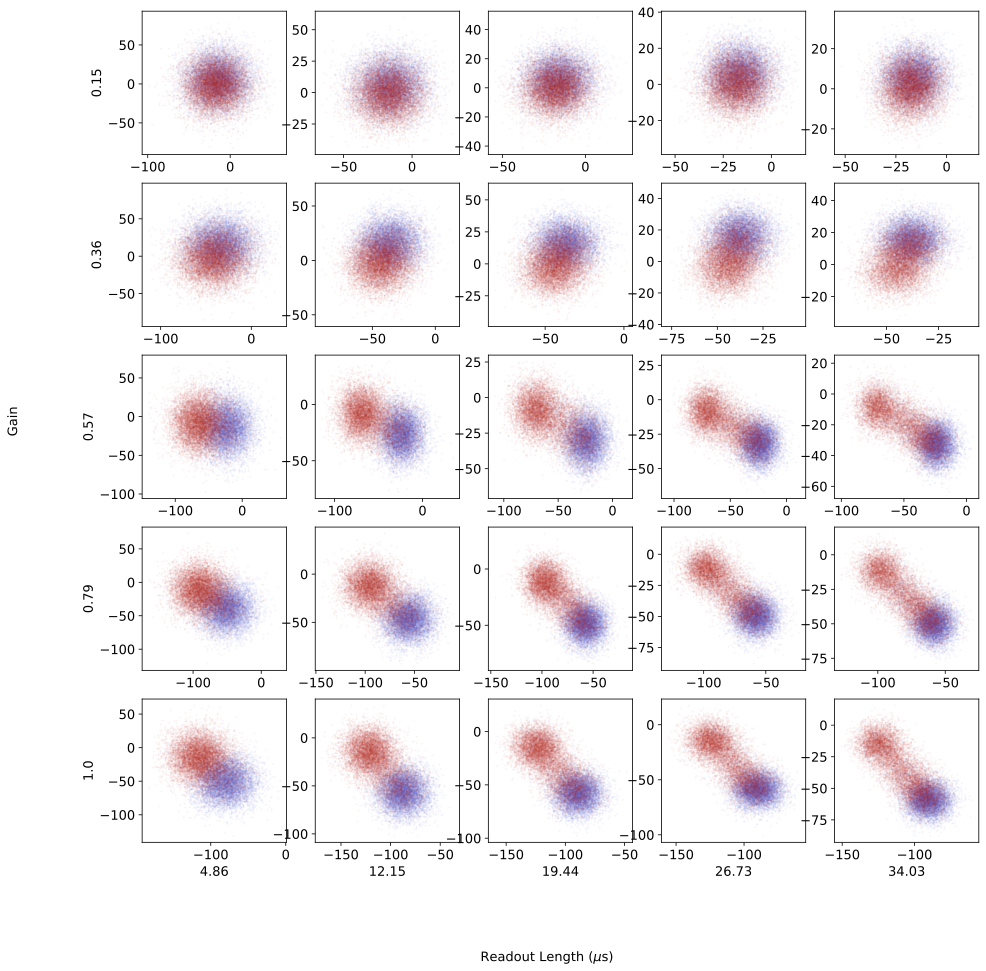

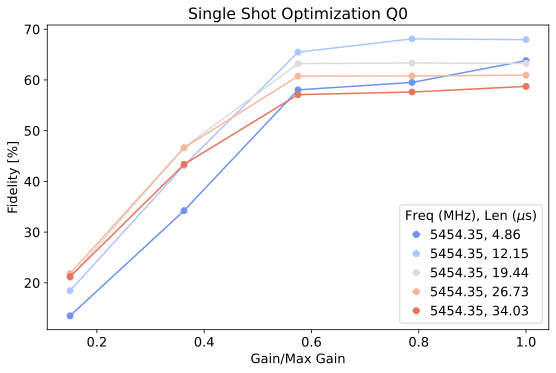

*Set cfg device.readout 0 gain to 0.575 from 0.5*
*Set cfg device.readout 0 readout_length to 12.1522 from 16.203*


  0%|          | 0/44000 [00:00<?, ?it/s]

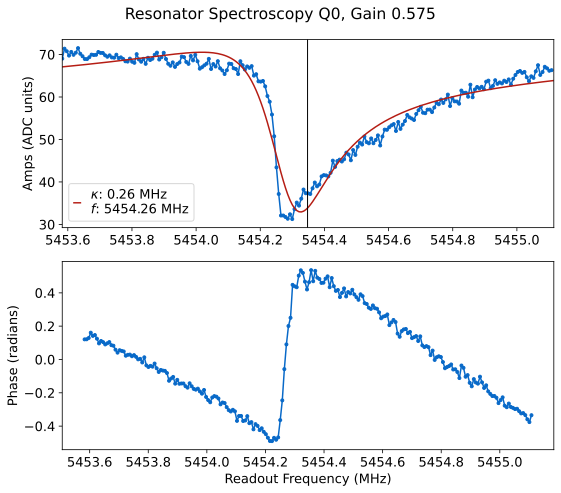

*Set cfg device.readout 0 frequency to 5454.2997 from 5454.3474*
*Set cfg device.readout 0 kappa to 0.2628 from 0.2205*
*Set cfg device.readout 0 qi to 5.0635 from 7.4457*
*Set cfg device.readout 0 qe to 3.5161 from 3.7032*
Unexpected parameters found in params: {'step_gain', 'step_f', 'step_len'}


  0%|          | 0/5 [00:00<?, ?it/s]

Max fidelity 67.418 %
Optimal params: 
 Freq (MHz) 5454.300 
 Gain (DAC units) 0.690 
 Readout length (us) 12.152
Set fidelity: 64.568 %
Set params: 
 Freq (MHz) 5454.300 
 Gain (DAC units) 0.575 
 Readout length (us) 9.722


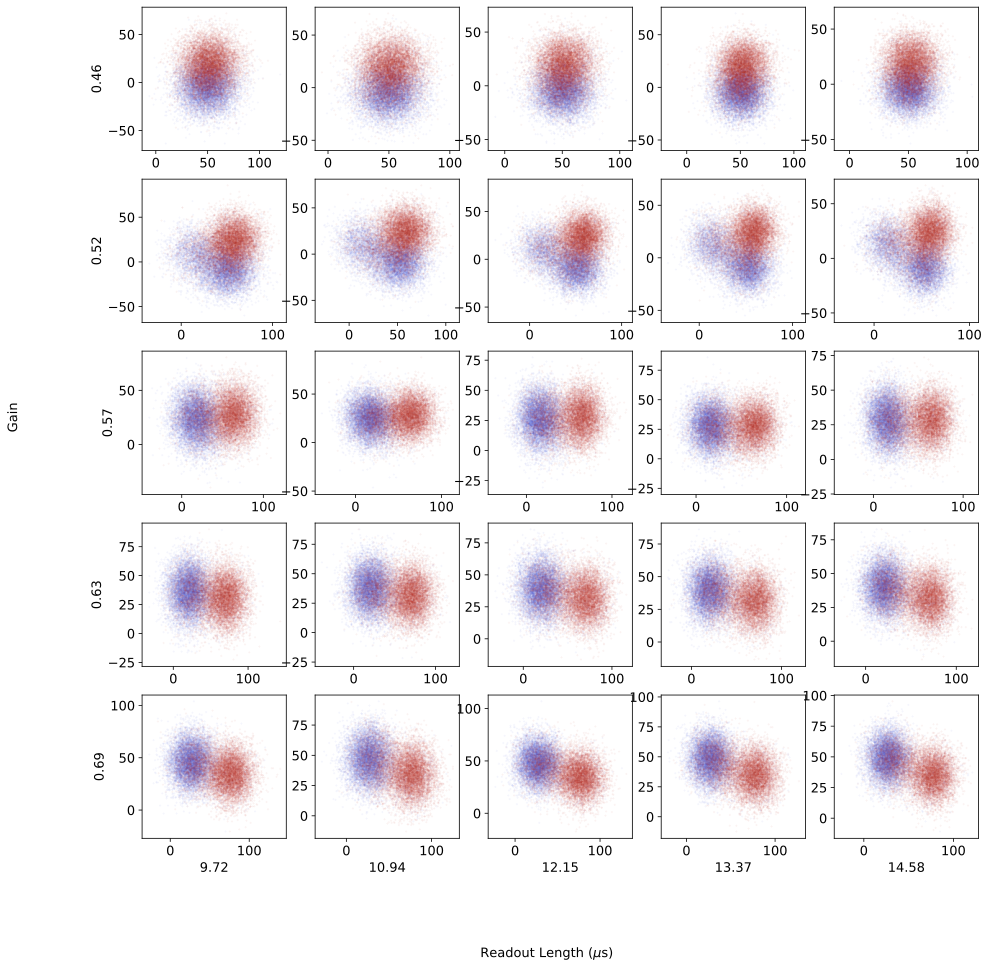

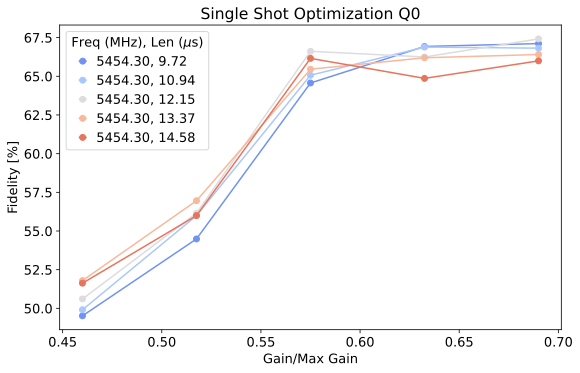

*Set cfg device.readout 0 gain to 0.575 from 0.575*
*Set cfg device.readout 0 readout_length to 9.7218 from 12.1522*


  0%|          | 0/10000 [00:00<?, ?it/s]

  0%|          | 0/10000 [00:00<?, ?it/s]

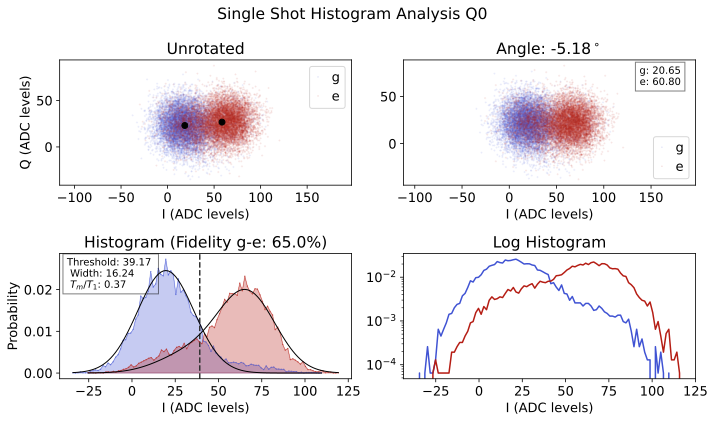

*Set cfg device.readout 0 phase to -5.1785 from 173.9188*
*Set cfg device.readout 0 threshold to 39.1735 from 33.9156*
*Set cfg device.readout 0 fidelity to 0.6505 from 0.597*
*Set cfg device.readout 0 sigma to 16.2366 from 13.8995*
*Set cfg device.readout 0 tm to 0.3741 from 0.5219*
*Set cfg device.qubit 0 tuned_up to True from True*


In [62]:
qubit_list=np.arange(3)
qubit_list=[0]
params = {'expts_f':1, 'expts_gain':5, 'expts_len':5}

# do_res also runs res spec and resets readout frequency that way each round. 
qubit_tuning.meas_opt(cfg_dict, qubit_list, params, do_res=True)

### Vary trig_offset to see if it changes fidelity. 

In [ ]:
# Single shot 
qubit_list = np.arange(3)
qubit_list =[0]
trig_list = np.linspace(0.2,0.6,12)
fids =[]
for qi in qubit_list:
    for trig in trig_list: 
        config.update_readout(cfg_path, 'trig_offset', trig, qi);
        shot=meas.HistogramExperiment(cfg_dict, qi=qi, params={'shots':20000, 'trigger':trig}, progress=False, display=False)
        fids.append(float(shot.data['fids'][0]))
    

### Play with LO freq (when using qick for LO)

In [ ]:
auto_cfg = config.load(cfg_path)
start_freq = auto_cfg.device.readout.frequency[qi]
start_mixer = auto_cfg.hw.soc.lo.mixer_freq[qi]
rng = np.linspace(-1000,1000,11)
fids=[]
for qi in qubit_list: 
    for r in rng: 
        config.update_lo(cfg_path, 'mixer_freq', start_mixer+r, qi)
        config.update_readout(cfg_path, 'frequency', start_freq-r, qi)
        shot=meas.HistogramExperiment(cfg_dict, qi=qi, params={'shots':20000})
        fids.append(shot.data['fids'][0])

config.update_lo(cfg_path, 'mixer_freq', start_mixer, qi)
config.update_readout(cfg_path, 'frequency', start_freq, qi)

#### Play with LO power

In [ ]:
qi = 0
gain_vals = [0.0375,0.05] 
fids = []
for gain in gain_vals:
    config.update_lo(cfg_path, 'gain', gain, qi)
    shotopt=meas.SingleShotOptExperiment(cfg_dict, qi=qi,params={'npts_f':5, 'npts_gain':5, 'npts_len':5})
    fids.append(shot.data['fids'][0])

# Active reset

### Check active reset at standard threshold

Setup reset uses the calibrated angle and runs active reset process at end, but also uses usual final_delay so that it's ok if reset not working

In [ ]:
qubit_list = np.arange(3)
qubit_list=[1]
d=[]
for qi in qubit_list:
    shot = meas.HistogramExperiment(cfg_dict, qi=qi, params={'shots':30000,'active_reset':True, 'setup_reset':True})
    shot.check_reset()
    #config.update_readout(cfg_path, 'reset_e', shot.data['reset_e'], qi)
    #config.update_readout(cfg_path, 'reset_g', shot.data['reset_g'], qi)
    d.append(shot)

## Don't do reset, but measure repeatedly 

In [ ]:
qi=1
shot=meas.HistogramExperiment(cfg_dict, qi=qi, params={'remeas':True, 'shots':40000})
shot.check_reset()

## Plot fidelity vs v threshold for active reset

In [ ]:
qi=1
rng=6
npts = 31
fids = []

auto_cfg = config.load(cfg_path)
threshold = auto_cfg['device']['readout']['threshold'][qi]
thresh = np.linspace(threshold-rng,threshold+rng,npts)
for i, t in enumerate(thresh):
    shot=meas.HistogramExperiment(cfg_dict, qi=qi, params={'shots':30000,'threshold_v':t, 'active_reset':True,'setup_reset':False, 'reset':3}, display=False, progress=False)
    fids.append(float(shot.data['fids'][0]))
    if i%4==0:
        print(f'Completed {i}/{len(thresh)}')

from pathlib import Path

fig = plt.figure()
plt.plot(thresh, fids, 'o-')
plt.xlabel('Threshold (mV)')
plt.ylabel('Fidelity')
plt.axvline(threshold, color='r', linestyle='--', label=f'Threshold = {threshold:.2f}')
plt.legend()
file_path = Path(shot.fname)
new_filename = file_path.name.rsplit(".", 1)[0] + "_fidelity_reset.png"
fig.savefig(file_path.parent / "images" / new_filename)

##  Single shot experiment using active reset

In [ ]:
qi=0
shot=meas.HistogramExperiment(cfg_dict, qi=qi, params={'shots':10000, 'active_reset':True,'setup_reset':True,'reset':1})


## Test single shot

In [ ]:
qi=0
shot=meas.HistogramExperiment(cfg_dict, qi=qi, params={'shots':30000, 'active_reset':True,'setup_reset':False})


In [ ]:
fidelity=[]
final=[1, 3, 5, 7, 10]


qi=0
for f in final:
    shot=meas.HistogramExperiment(cfg_dict, qi=qi, params={'shots':20000, 'active_reset':True,'final_delay':f, 'reset':1}, display=False)   

    fidelity.append(shot.data['fids'][0])

In [ ]:
fidelity


In [ ]:
fidelity


In [ ]:
qi=2
amp_rabi = meas.RabiExperiment(cfg_dict,qi=qi, params={'active_reset':True})
amp_rabi2 = meas.RabiExperiment(cfg_dict,qi=qi, params={'active_reset':False})

plt.figure()
plt.plot(amp_rabi.data['xpts'], amp_rabi.data['avgi'])
plt.plot(amp_rabi2.data['xpts'], amp_rabi2.data['avgi'])

plt.figure()
plt.plot(amp_rabi.data['xpts'], amp_rabi.data['avgq'])
plt.plot(amp_rabi2.data['xpts'], amp_rabi2.data['avgq'])


In [ ]:
t1 = meas.T1Experiment(cfg_dict,qi=qi, params={'active_reset':True})
#t12 = meas.T1Experiment(cfg_dict,qi=qi, params={'active_reset':False})

plt.figure()
plt.plot(t1.data['xpts'], t1.data['avgi'], label='Active Reset')
plt.plot(t12.data['xpts'], t12.data['avgi'])
plt.legend()
# plt.figure()
# plt.plot(t1.data['xpts'], t1.data['avgq'])
# plt.plot(t12.data['xpts'], t12.data['avgq'])

In [ ]:
t2 = meas.T2Experiment(cfg_dict,qi=qi, params={'active_reset':True})
#t22 = meas.T2Experiment(cfg_dict,qi=qi, params={'active_reset':False})

plt.figure()
plt.plot(t2.data['xpts'], t2.data['avgi'], label='Active Reset')
plt.plot(t22.data['xpts'], t22.data['avgi'])
plt.legend()
# plt.figure()
# plt.plot(t2.data['xpts'], t2.data['avgq'])
# plt.plot(t22.data['xpts'], t22.data['avgq'])

# histograms are different for active reset vs no active reset!!! because it's getting the full set of measured data. you should adjust to the first one. 
plt.figure()
plt.plot(t2.data['bin_centers'], t2.data['hist'])
plt.plot(t22.data['bin_centers'], t22.data['hist'])

In [ ]:
t2 = meas.T2Experiment(cfg_dict,qi=qi, params={'active_reset':True, 'experiment_type':'echo'})
t22 = meas.T2Experiment(cfg_dict,qi=qi, params={'active_reset':False, 'experiment_type':'echo'})

plt.figure()
plt.plot(t2.data['xpts'], t2.data['avgi'])
plt.plot(t22.data['xpts'], t22.data['avgi'])

plt.figure()
plt.plot(t2.data['xpts'], t2.data['avgq'])
plt.plot(t22.data['xpts'], t22.data['avgq'])

In [ ]:
t2 = meas.T2Experiment(cfg_dict,qi=qi, params={'active_reset':True})

plt.figure()
plt.plot(t2.data['xpts'], t2.data['avgi'], label='active reset')
plt.plot(t22.data['xpts'], t22.data['avgi'], label='Normal')
plt.legend()
# histograms are different for active reset vs no active reset!!! because it's getting the full set of measured data. you should adjust to the first one. 
plt.figure()
plt.plot(t2.data['bin_centers'], t2.data['hist'])

# change the hist to take the first measurement 
plt.plot(t22.data['bin_centers'], t22.data['hist'])

In [ ]:
# histograms are different for active reset vs no active reset!!! because it's getting the full set of measured data. you should adjust to the first one. 
plt.figure()
plt.plot(amp_rabi.data['bin_centers'], amp_rabi.data['hist'])
plt.plot(amp_rabi2.data['bin_centers'], amp_rabi2.data['hist'])

## Sweep threshold

In [ ]:
d = []
qi=0
rng=25
auto_cfg = config.load(cfg_path)
threshold = auto_cfg['device']['readout']['threshold'][qi]
thresh = np.linspace(threshold-rng,threshold+rng,16)
for i, t in enumerate(thresh):
    shot=meas.HistogramExperiment(cfg_dict, qi=qi, params={'shots':10000,'threshold_v':t, 'active_reset':True,'setup_reset':True}, display=False, progress=False)
    d.append(shot)
    if i%4==0:
        print(f'Completed {i}/{len(thresh)}')
    #shot.check_reset()
import slab_qick_calib
slab_qick_calib.calib.readout_helpers.plot_reset(d)

In [ ]:
import slab_qick_calib
slab_qick_calib.calib.readout_helpers.plot_reset(d)

## Turn off active reset for all config chans

In [ ]:
for qi in range(20):
    config.update_readout(cfg_path, 'active_reset',False, qi)

## Turn on active reset for channels where it seems to be working

In [ ]:
e_success = 0.15 # Ratio of e proportion after active reset compared to before
g_vs_e = 2 # Ratio of g proportion to e proportion after active reset

auto_cfg = config.load(cfg_path)
reset_e = auto_cfg['device']['readout']['reset_e']
reset_g = auto_cfg['device']['readout']['reset_g']
result = np.array(reset_e)< e_success | np.array(reset_g)/np.array(reset_e)<g_vs_e
for qi in range(20):
    config.update_readout(cfg_path, 'active_reset',bool(result[qi]), qi)

## Check reset (plotting result of reset)

In [ ]:
qubit_list = np.arange(3)
qubit_list =[0]
for qi in qubit_list:
    shot = meas.HistogramExperiment(cfg_dict, qi=qi, params={'shots':50000,'active_reset':True})
    shot.check_reset()

# Chi

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

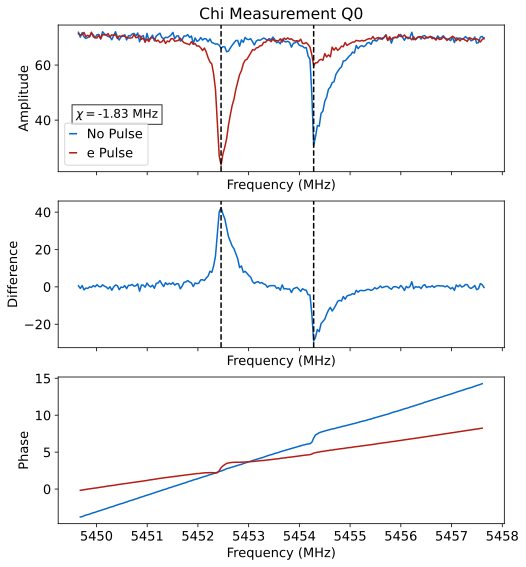

*Set cfg device.readout 0 chi to -1.8254 from -1.8254*


In [69]:
# Need a tuned up pi pulse for this
span = 8
qubit_list = [0]
for qi in qubit_list: 
    #chi, chi_val=measure_func.check_chi(cfg_dict, qi)
    chi, chi_val=measure_func.check_chi(cfg_dict, qi, span=span)
    auto_cfg = config.update_readout(cfg_path, 'chi', chi_val, qi)

# 2 Qubit

In [ ]:
t12q = meas.T1_2Q(cfg_dict, qi=[10,0], params={'active_reset':False, })

In [ ]:
rabi2q = meas.Rabi_2Q(cfg_dict, qi=[10,0], params={'active_reset':True})

# EF 

### Initial setting of frequencies based on guess for alpha

In [389]:
# Initial set of the frequencyies based on guess for alpha 
alpha = -150
#qubit_list = np.arange(3)
qubit_list = [0]
auto_cfg = config.load(cfg_path)
for i in qubit_list: 
    f_ge = auto_cfg['device']['qubit']['f_ge'][i]
    auto_cfg = config.update_qubit(cfg_path, 'f_ef', f_ge+alpha, i)

*Set cfg device.qubit 0 f_ef to 4447.6386 from 3800*


## Spectroscopy EF

### General search

Performing medium scan


  0%|          | 0/464000 [00:00<?, ?it/s]

R2:0.857	Fit par error:0.034	 Best fit:b'avgi'


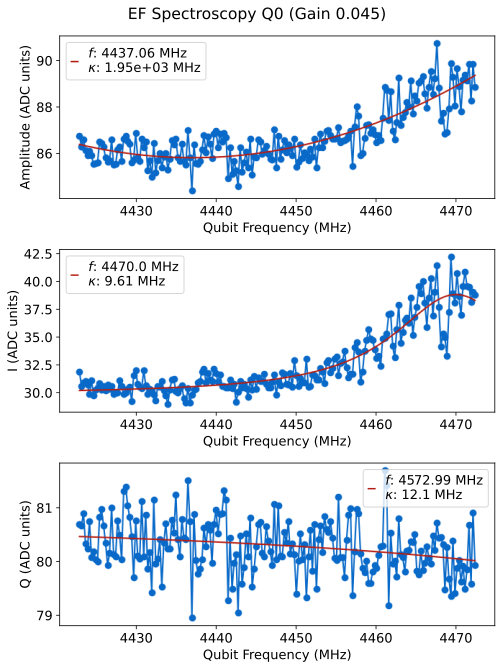

*Set cfg device.qubit 0 f_ef to 4470.0004 from 4447.6386*
Performing fine scan


  0%|          | 0/464000 [00:00<?, ?it/s]

R2:0.814	Fit par error:0.053	 Best fit:b'amps'


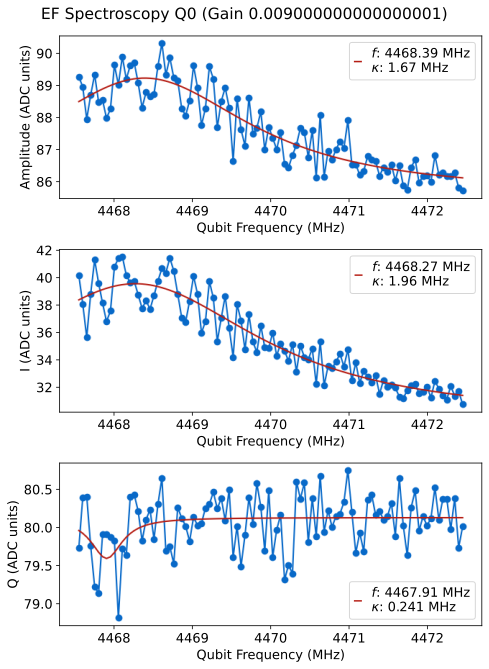

*Set cfg device.qubit 0 f_ef to 4468.3916 from 4470.0004*
Found qubit 0


In [390]:
qubit_list= np.arange(3)
bad_qubits=[]
qubit_list=[0]
for qi in qubit_list:
    status, ntries = qubit_tuning.find_spec(qi, cfg_dict, start='medium', freq='ef')
    if not status:
        bad_qubits.append(qi)

### Specific width

  0%|          | 0/160000 [00:00<?, ?it/s]

R2:0.364	Fit par error:0.079	 Best fit:b'avgi'


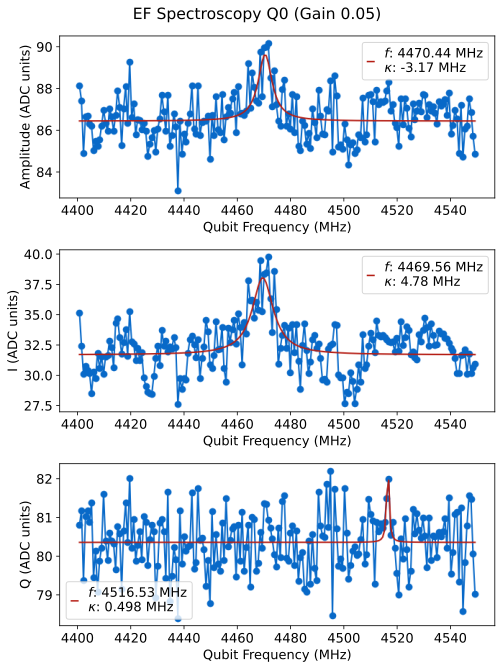

In [407]:
# You may want to update this frequency, which will be the center of the scan. 
#style huge, coarse, medium, fine 
update=False

qubit_list = np.arange(3)
qubit_list=[0]
for qi in qubit_list:
    # set up filter and attenuation  
    setup_readout_chain(qi, bw=1000, atten1_dac=0, atten2_dac=0, atten_adc=0, cfg=auto_cfg, hw=soc)
    setup_qubit_drive_chain(qi, bw=800, atten1_dac=0, atten2_dac=0, center_freq=4500, cfg=auto_cfg, hw=soc)
    #qspec=meas.QubitSpec(cfg_dict, qi=qi, style='medium', params={'checkEF':True, 'reps':500,'gain':0.2})
    qspec=meas.QubitSpec(cfg_dict, qi=qi, style='medium', params={'checkEF':True, "start":4400,'reps':800,'gain':0.05, 'span':150})

    #qspec=meas.QubitSpec(cfg_dict, qi=qi, style='medium', params={'checkEF':True})#, params={'span':500, 'expts':1000,'reps':500,'gain':0.2})
    if update and qspec.status:
        auto_cfg = config.update_qubit(cfg_path, 'f_ef', qspec.data["best_fit"][2], qi)

## Rabi EF

Unexpected parameters found in params: {'sigma'}


  0%|          | 0/30000 [00:00<?, ?it/s]

R2:0.896	Fit par error:0.058	 Best fit:b'avgi'


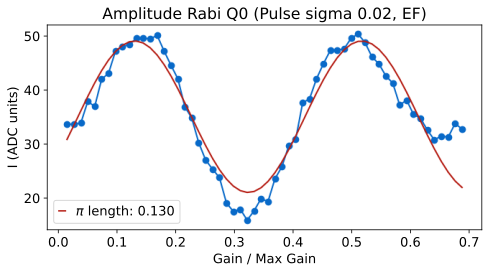

*Set cfg device.qubit 0 ('pulses', 'pi_ef', 'gain') to 0.1303 from 0.131*


In [413]:
# If first time, initialize the sigma and gain to those of the ge 
first_time = False
update = True

qubit_list = np.arange(3)
qubit_list=[0]

bad_qubits = []
auto_cfg = config.load(cfg_path)

for qi in qubit_list: 
    if first_time:
        #config.update_qubit(cfg_path, 'f_ef', auto_cfg.device.qubit.f_spec_ef[qi], qi)
        auto_cfg = config.update_qubit(cfg_path, ('pulses','pi_ef','sigma'), auto_cfg['device']['qubit']['pulses']['pi_ge']['sigma'][qi], qi)
        auto_cfg = config.update_qubit(cfg_path, ('pulses','pi_ef','gain'), auto_cfg['device']['qubit']['pulses']['pi_ge']['gain'][qi], qi)
    amp_rabi = meas.RabiExperiment(cfg_dict,qi=qi, params={'checkEF':True, 'reps':500, 'max_gain':0.7, 'sigma':0.02})#, disp_kwargs={'show_hist':True})
    if update and amp_rabi.status:
        config.update_qubit(cfg_path, ('pulses','pi_ef','gain'), amp_rabi.data['pi_length'], qi)
    else:
        print(f'Amplitude Rabi fit failed for qubit {qi}')
        bad_qubits.append(qi)

    # MAX GAIN IS GOING TO 5 

## Qubit Temperature

  0%|          | 0/27840 [00:00<?, ?it/s]

R2:0.955	Fit par error:0.032	 Best fit:b'avgi'


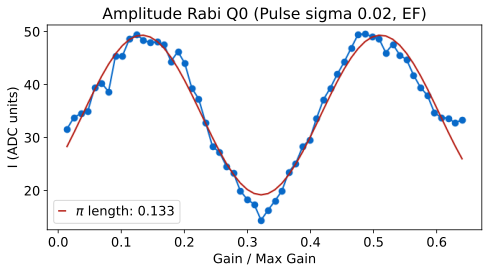

  0%|          | 0/14 [00:00<?, ?it/s]

 C:\_Lib\python\qq\slab_qick_calib\calib\readout_helpers.py: 1139

R2:0.701	Fit par error:0.638	 Best fit:b'avgi'


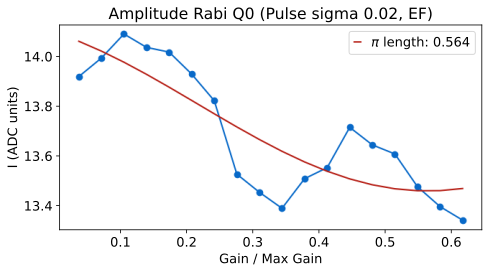

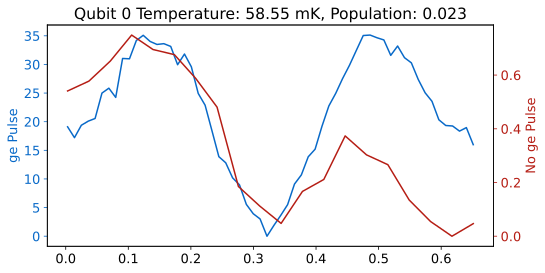

*Set cfg device.qubit 0 temp to 58.5463 from 0*
*Set cfg device.qubit 0 pop to 0.0231 from 0*


In [414]:
qubit_list = np.arange(3)
qubit_list=[0]
# Setting number of rounds multiplies the default number of rounds by that number, so can be greater than or less than 1. 
# Make sure to run single shot first 
for qi in qubit_list: 
    # rounds will make scan take longer, needed for lower temperatures. 
    temp, pop = measure_func.measure_temp(cfg_dict, qi=qi, temp=50)# , rounds=5)
    auto_cfg = config.update_qubit(cfg_path, 'temp', temp, qi)
    auto_cfg = config.update_qubit(cfg_path, 'pop', pop, qi)

## Calculate Ec and EJ

In [417]:
auto_cfg = config.load(cfg_path)
import scqubits as scq
for i in np.arange(1):
    alpha =  auto_cfg.device.qubit.f_ef[i] - auto_cfg.device.qubit.f_ge[i]
    en = scq.Transmon.find_EJ_EC(auto_cfg.device.qubit.f_ge[i]/1000,alpha/1000)
    print(alpha)
    print(en)
    q = np.pi*2 * auto_cfg.device.qubit.f_ge[i] * auto_cfg.device.qubit.T1[i]
    print(q)

-128.85150000000067
[23.04536798  0.12093738]
887722.5641456982


## Ramsey EF

  0%|          | 0/92800 [00:00<?, ?it/s]

R2:0.918	Fit par error:0.060	 Best fit:b'avgi'


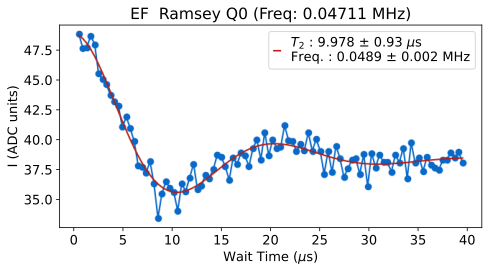

*Set cfg device.qubit 0 f_ef to 4468.3782 from 4468.38*


In [421]:
update=True
qubit_list=np.arange(3)
qubit_list=[0]

for qi in qubit_list:
    t2r = meas.T2Experiment(cfg_dict, qi=qi, params={'checkEF':True, 'span':40, 'expts':100})#, disp_kwargs={'show_hist':True})

    if update and t2r.status:
        config.update_qubit(cfg_path, 'f_ef', t2r.data['new_freq'], qi)
    else:
        print('T2 Ramsey fit failed')

# Calculate qubit params

In [ ]:

# If this is the first time you're doing this, create new file 

qubit_params.ham(cfg_path)
qubit_params.delta(cfg_path)
qubit_params.cohere(cfg_path)

# Stark

## Ramsey

### Single experiment

In [ ]:
qi=0
t2_stark = meas.RamseyStarkExperiment(cfg_dict, qi=qi, params={'stark_gain':1,'df':40,'acStark':True,'ramsey_freq':0.1, 'expts':100})

### Create stark part of config file for tracking Gain-> Freq
Only do once for each config

In [ ]:
# config.init_stark_section(cfg_dict['cfg_file'], 6)

### Sweep frequency

In [ ]:
qubit_list = np.arange(3)
qubit_list=[3]

gain = np.linspace(0.1,1,10)
for qi in qubit_list:
    for g in gain:
        t2rstark=meas.RamseyStarkFreqExperiment(cfg_dict, qi=qi, params={'step':1/430+0.001, 'stark_gain':g, 'start_df':30, 'end_df':150, 'expts_df':10})

### Calibrate stark power positive freq

You'll want to adjust the step size / expts to capture the full frequency range 

In [ ]:
qubit_list = np.arange(3)
qubit_list=[0]
d=[]
freqs= [50]
update=True
for f in freqs:
    for qi in qubit_list:
        params={'step':0.015, 'expts_gain':16, 'df':f, 'start_gain':0.035, 'end_gain':0.16,'expts':140, 'ramsey_freq':0.1}
        t2rstark=meas.RamseyStarkPowerExperiment(cfg_dict, qi=qi, params=params, live_plot=True)
        d.append(t2rstark)
        if update: t2rstark.update(neg=False)

In [ ]:
plt.figure()
for i in range(len(t2rstark.data['bin_centers'])):
    plt.plot(t2rstark.data['bin_centers'][i], t2rstark.data['hist'][i])

### Negative frequency

In [ ]:
#qubit_list = np.arange(3)
update=True 
qubit_list=[0]
df = -45
for qi in qubit_list:
    params = {'step':0.015, 'expts_gain':12, 'df':df, 'start_gain':0.04, 'end_gain':0.11, 'expts':140}
    t2rstark=meas.RamseyStarkPowerExperiment(cfg_dict, qi=qi, params=params)#, live_plot=True)
    if update: t2rstark.update(neg=True)
#handy.plot_many(d, title='Ramsey Stark', save_path=cfg_dict['expt_path'])

## T1

### Single exp

In [ ]:
qi=1
gain_list = [2]
for g in gain_list:
    params = {'stark_gain':g,'df':40,'expts':60, 'span':106}
    #params={'active_reset':False, 'df':200, 'stark_gain':g,'expts':300,'start':10,'span':0,'reps':1000}
    t1 = meas.T1StarkExperiment(cfg_dict, qi=qi, params=params) 

### Gain sweep

In [ ]:
qubit_list = np.arange(3)
qubit_list=[0]

flist=[-45]
for f in flist:
    for qi in qubit_list: 
        #t1_neg = meas.T1StarkPowerExperiment(cfg_dict, qi=qi, params={'df':-70,'start_gain':0.02,'end_gain':0.2,'start':3, 'rounds':4})
        params={'df':f,'start_gain':0,'end_gain':0.14,'start':0.2, 'rounds':1,'span':103,'expts_gain':20, 'expts':80}
        t1_pos = meas.T1StarkPowerExperiment(cfg_dict, qi=qi, params=params)#, live_plot=True) 
        plt.figure()
        for i in range(len(t1_pos.data['bin_centers'])):
            plt.plot(t1_pos.data['bin_centers'][i], t1_pos.data['hist'][i])

### Freq sweep

In [ ]:
t1_freq = meas.T1StarkFreqExperiment(cfg_dict, qi=19, params={'span':6, 'span_f':100, 'start_df':50, 'expts_f':100})

### Single evo point linear gain sweep

In [ ]:
t1_cont = meas.T1StarkPowerSingle(cfg_dict, qi=0, params={"rounds":1, 'wait_time':99, 'expts':100})

### Sweep frequency linearly, 1d scan

In [ ]:
t1_quad = meas.T1StarkPowerQuadSingle(cfg_dict, qi=0, params={"rounds":1, 'wait_time':99, 'expts':300, "stop_f":3})

# It would be good to add a few excited state and ground state measurements to this. 

In [ ]:
t1_norm = -1/np.log((t1_quad_2d.data['scale_data']-shot.data['g_norm'])/shot.data['e_norm'])*tau/auto_cfg.device.qubit.T1[qi]

### Sweep frequency linearly, 2d scan sweep over time

In [ ]:
qi=0
shot=meas.HistogramExperiment(cfg_dict, qi=qi, params={'shots':30000, 'active_reset':True,'setup_reset':False, 'reset':2})
t1 = meas.T1Experiment(cfg_dict, qi=qi)

In [ ]:
print(shot.data['g_norm'])
print(shot.data['e_norm'])

In [ ]:
print(shot.data['vg'])
print(shot.data['ve'])

### Corrected 2D scan

In [ ]:
qi = 0

#params={'wait_time':tau, "stop_f":6, 'expts':200, "sweep_pts":10, 'g_norm':shot.data['g_norm'], 'e_norm':shot.data['e_norm']}

for i in range(1):
    shot=meas.HistogramExperiment(cfg_dict, qi=qi, params={'shots':30000, 'active_reset':True,'setup_reset':False, 'reset':2})
    #shot.update()
    t1 = meas.T1Experiment(cfg_dict, qi=qi)
    t1.update()
    if t1.data['new_t1']>103:
        tau = 103
    else:
        tau = t1.data['new_t1']
    #params={"wait_time":tau, "stop_f":6, 'expts':300, "sweep_pts":15, 'g_norm':shot.data['g_norm'], 'e_norm':shot.data['e_norm'], 'vg':shot.data['vg'], 've':shot.data['ve']}
    params={"wait_time":tau, "df":6, 'expts':300, "sweep_pts":15, 'g_norm':shot.data['g_norm'], 'e_norm':shot.data['e_norm'], 'vg':shot.data['vg'], 've':shot.data['ve']}

    t1_quad_2d = meas.T1StarkPowerQuad2D(cfg_dict, qi=qi,params=params)# , live_plot=True)

In [ ]:
t1_quad_2d.data['stark_gain_pts'][0]

In [ ]:
t1_quad_2d.cfg.expt.wait_time

In [ ]:
plt.figure()
for i in range(len(t1_quad_2d.data['bin_centers'])):
    #plt.plot(t1_quad_2d.data['bin_centers'][i], t1_quad_2d.data['hist'][i])
    plt.plot(t1_quad_2d.data['f_pts'][i], t1_quad_2d.data['t1_norm'][i])#+0.43*i)

In [ ]:
self.data['t1_norm'] = -1/np.log((self.data['scale_data']-self.cfg.expt['g_norm'])/self.cfg.expt['e_norm'])*self.cfg.expt.wait_time/self.cfg.device.qubit.T1[q]


In [ ]:
qi=0

tau=104
t1_quad_2d = meas.T1StarkPowerQuad2D(cfg_dict, qi=qi, params={'wait_time':tau, "stop_f":3.5, 'expts':10, "sweep_pts":100}, live_plot=True)

In [ ]:
plt.figure()
for i in range(len(t1_quad_2d.data['bin_centers'])):
    plt.plot(t1_quad_2d.data['bin_centers'][i], t1_quad_2d.data['hist'][i])

In [ ]:
plt.figure()
plt.imshow(t1_norm, aspect='auto', origin='lower')
plt.colorbar(label='avgi')
plt.xlabel('Sweep Points')
plt.ylabel('Wait Time Index')

In [ ]:
len(t1_quad_2d.data['xpts'])

In [ ]:
t1_quad_2d.data['xpts']

In [ ]:
t1_quad_2d.display()